---
pagetitle: "DL-1-proj | VG"
title: "Mushroom Classification: Common Genus's Images"
subtitle: "Deep Learning Project"
author: "Vilmantas Gėgžna"
date: 2024-01-31
date-modified: today
date-format: iso
language:
  title-block-modified: "Updated"
fig-align: center
jupyter: python3
format:
  html:
    embed-resources: true
    crossrefs-hover: true
    toc: true
    toc_float: true
    toc-location: left
    toc-depth: 4
    number-sections: true
    number-depth: 3
    code-tools: true
    code-fold: show # possible options: false, true, show
    code-line-numbers: true
    html-math-method: mathjax
    link-external-icon: true
    link-external-newwindow: true
    link-external-filter: "(?ds-project|--proj)"
    page-layout: full
crossref:
  chapters: true
  fig-title: "Fig." # (default is "Figure")
  tbl-title: Table # (default is "Table")
  title-delim: . # (default is ":")
editor: # VS Code
  render-on-save: false
---


::: {.content-hidden when-format="html"}

<br><br><br><br><br>

<center>

> **IMPORTANT**
>
> This Jupyter notebook contains the `source code` of the analysis.  
> The analysis is intended to be studied from its rendered HTML document.  
> <span style="color: green;"> Please, **open the HTML** file, </span> which is available at:
>
> ►►► <https://gegznav.github.io/ds-projects/mushrooms> ◄◄◄
> &nbsp; &nbsp;
>
> ```
> •▲•
> ```

</center>
<br><br><br><br><br><br><br>

:::


<style>
#title-block-header.quarto-title-block.default .quarto-title-meta {
  display: grid;
  grid-template-columns: repeat(3, 1fr);
}

div.sourceCode {
  margin: 0;
}

/* R code indicator */
pre.sourceCode .r {
  border-left: 5px solid #7b97ea;
  border-radius: 0
}
.r .fu {font-weight: bold;}

/* Python code indicator */
pre.sourceCode .python {
  border-left: 5px solid #CFB53B;
  border-radius: 0
}
.python .kw {font-style: italic;}

/* Bash code indicator */
pre.sourceCode .bash {
  border-left: 5px solid #bbb;
  border-radius: 0
}

/* Details sections */
details[open].with-border {
  padding: 1px 5px 1px 5px;
  border-style: solid;
  border-color: grey;
  border-width: 3px;
  border-radius: 5px;
}

/* Tables */
caption, .table-caption {
  text-align: left;
  color: #5a6570;
};

table .dataframe .table-striped thead th {
  text-align: left !important;
}


</style>

::: {.content-hidden when-format="html"}

This cell contains `CSS` code.

:::


<center>

![Mushroom Classification project logo. Originally generated with [Leonardo.Ai](https://leonardo.ai/).](<./img/logo%20(LeonardoAI).jpg>){max-width=100%, width=400px}

</center>


---


# Summary {.unnumbered}


In light of the alarming **7,500 annual cases of mushroom poisoning** in the United States (Source: [Applied Mycology](https://www.tandfonline.com/doi/full/10.1080/00275514.2018.1479561)), primarily stemming from misidentification, this project addresses the critical need for **preventative** measures. The initiative involves developing a deep **learning-based model for mushroom classification**, aiming to curb incidents through accurate identification of edible and toxic varieties during foraging activities. This project marks the *initial stage* of this crucial endeavor. Leveraging a Kaggle dataset featuring various mushroom genera, including *Agaricus*, *Amanita*, *Boletus*, *Cortinarius*, *Entoloma*, *Lactarius*, *Russula*, and *Suillus*, the analysis employs **state-of-the-art deep learning techniques** such as **computer vision**, **data augmentation** and **transfer learning**. **Python**, **PyTorch**, **Lightning**, and **TensorBoard** are the tools of choice for implementing and evaluating these advanced techniques.

A rigorous plan was executed to prepare four models based on the ***ResNet-18*** architecture, pre-trained on the renowned ***ImageNet*** dataset, showcasing a commitment to leveraging established foundations for enhanced model performance. Rigorous evaluation followed, ensuring the effectiveness of each model in accurately classifying mushroom images.

The current **best-performing model** demonstrates notable outcomes, achieving 79.7% accuracy in training, 79.7% in validation, and an **82.1% accuracy** rate in the test set. Impressively, in the development environment, the model achieved an efficient prediction speed of approximately **18 milliseconds per image**, emphasizing its **practicality for real-time applications**. It's worth noting that exploring other neural network architectures may offer the potential for improved results. Striking the right balance between accuracy and speed will be a crucial consideration in optimizing the model for desired applications.

*Genus-specific analysis* reveals diverse predictability, showcasing *Boletus* as the **most accurately captured genus** with an impressive sensitivity score of **95.8%**. Notably reliable predictions were also observed for *Suillus*, *Amanita*, and *Boletus*, each boasting **predictive value** scores of **90.5%**, **90.4%**, and **89.9%**, respectively. However, the test set exposes some confusion, as 11.8% of predictions for *Russula* are identified as *Lactarius*, 9.7% of *Etoloma* predictions actually belong to *Cortinarius*, and, **concerningly**, 10.8% of *Agaricus* predictions turn out to be *Amanita*. These findings highlight areas for improvement in the model's performance and underscore the importance of refining the classification algorithm to enhance accuracy, particularly in distinguishing between closely related genera.

Further investigation of the results highlights the potential benefits of **image standardization**. This suggests that avoiding excessive zooming and showing a more general view of a mushroom during image capture may enhance the overall quality of correct mushroom identification. Consequently, this finding prompts considerations for **refining data acquisition strategies**, such as implementing standardized protocols for image capture, to optimize the model's predictive capabilities.

:::{.callout-tip}

#### On the Term "Class"

In the context of taxonomy, the term "class" denotes a taxonomic rank higher than the genus. In data science, the term "class" is used to represent a category of data. **For the purposes of this project,** the term "class" is employed in the latter sense, where "class" is synonymous with "category" and corresponds to "genus" (**"class" = "category" = "genus"**).

:::

# Introduction

**Mushroom poisoning** poses a significant public health concern, with approximately **7,500 reported cases annually** in the United States alone during 18 years of investigation (Source: [Applied Mycology](https://www.tandfonline.com/doi/full/10.1080/00275514.2018.1479561)). The primary cause of these incidents is attributed to the misidentification of edible mushroom species, a factor deemed preventable through *education*. 
In response to this pressing need for a preventative solution, there is an initiative to **develop a deep learning-based model for mushroom classification.** The primary objective is to create a machine learning model capable of accurately classifying mushroom types, aiding individuals in distinguishing between edible and toxic varieties during foraging activities. This project is the *initial stage* of this initiative.


In this project, a [Kaggle](https://www.kaggle.com/datasets/maysee/mushrooms-classification-common-genuss-images) dataset of mushroom pictures is analyzed. It contains several genera of mushrooms (genus's name in Latin and *approximate* translations to English and Lithuanian languages):

- ***Agaricus*** (en. champignon mushrooms, lt. pievagrybiai)
- ***Amanita*** (en. fly swatters, lt. musmirės)
- ***Boletus*** (en. boletes, lt. baravykai)
- ***Cortinarius*** (en. webcaps, lt. nuosėdžiai)
- ***Entoloma*** (en. pinkgills, lt. gijabudės)
- ***Lactarius*** (en. milkcaps, lt. piengrybiai)
- ***Russula*** (en. brittlegills, lt. ūmėdės)
- ***Suillus*** (en. the genus slippery jack belongs to, lt. kazlėkai)

The analysis includes state-of-the-art deep learning techniques, such as **transfer learning** and **fine-tuning** and tools such as **PyTorch**, **Lightning** and **Python**. The analysis and its results are presented in the following sections.

# Setup


Some preparation steps are described in the `README.md` file of the project (e.g., [here](https://github.com/GegznaV/ds-projects/blob/main/mushrooms/README.md)).
The Python code that imports the necessary tools and defines the main custom functions and classes, is presented below.


In [1]:
# | code-summary: "Code: **The main Python setup**"
# | code-fold: true

# Automatically reload certain modules
%reload_ext autoreload
%autoreload 1

# Plotting
%matplotlib inline

# Packages and modules -------------------------------
# Utilities
import os
import warnings
import numpy as np
import logging
from copy import deepcopy
from contextlib import contextmanager
from pathlib import Path

# Data frames
import pandas as pd

# EDA and plotting
import seaborn as sns
import matplotlib.pyplot as plt

# Image processing
import PIL
import matplotlib.patheffects as path_effects

# ML: preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import ConfusionMatrixDisplay, classification_report

# Deep learning
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset

import torchmetrics
from torchinfo import summary

import torchvision
import torchvision.transforms.v2 as transforms
import torchvision.models as models

import lightning as L
from lightning.pytorch.loggers import CSVLogger, TensorBoardLogger
from lightning.pytorch.callbacks.early_stopping import EarlyStopping
from lightning.pytorch.callbacks import LearningRateMonitor, ModelCheckpoint
from lightning.pytorch.tuner import Tuner


# Settings --------------------------------------------
# Default plot options
plt.rc("figure", titleweight="bold")
plt.rc("axes", labelweight="bold", titleweight="bold")
plt.rc("font", weight="normal", size=10)
plt.rc("figure", figsize=(10, 3))

# Pandas options
pd.set_option("display.max_rows", 1000)
pd.set_option("display.max_columns", 300)
pd.set_option("display.max_colwidth", 50)  # Possible option: None
pd.set_option("display.float_format", lambda x: f"{x:.2f}")
pd.set_option("styler.format.thousands", ",")

# Turn off the scientific notation for floating point numbers.
np.set_printoptions(suppress=True)

In [2]:
%load_ext watermark
%watermark --conda --python -iv
# The main DL packages are: --packages torch,lightning,torchvision

Python implementation: CPython
Python version       : 3.11.7
IPython version      : 8.19.0

conda environment: TC-M4

numpy       : 1.26.2
torch       : 2.1.2+cu121
lightning   : 2.1.3
matplotlib  : 3.8.2
torchmetrics: 1.3.0.post0
PIL         : 10.2.0
pandas      : 2.1.4
seaborn     : 0.13.1
torchvision : 0.16.2+cu121
logging     : 0.5.1.2



</details>

In [3]:
# | code-summary: Function `copy_and_resize_images()`
# | code-fold: true


def copy_and_resize_images(input_dir: str, output_dir: str, target_size=256):
    """Read, resize and save images to a new directory.

    Args:
        input_dir (str): The directory containing the images to resize.
        output_dir (str): The directory where the resized images will be saved.
        target_size (int): The size of the resized image's shorter side.
    """
    # Create output directory if it doesn't exist
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    # Create a transformation to resize images
    transform = transforms.Resize(target_size)
    # Apply the transformation to all images in the input directory
    for root, _, files in os.walk(input_dir):
        relative_path = os.path.relpath(root, input_dir)
        output_subfolder = os.path.join(output_dir, relative_path)

        if not os.path.exists(output_subfolder):
            os.makedirs(output_subfolder)

        for file in files:
            input_path = os.path.join(root, file)
            output_path = os.path.join(output_subfolder, file)
            img = PIL.Image.open(input_path)
            resized_img = transform(img)
            resized_img.save(output_path)


# Notes on image reading test:
# - Time: 3.1 to only read
# - Time: 52.4s to read and resize
# - Time: 1m 5.0s to read, resize, and save

In [4]:
# | code-summary: Function `plot_grid_of_images()`
# | code-fold: true


def plot_grid_of_images(
    images,
    true_class_codes,
    pred_class_codes=None,
    list_of_class_labels=None,
    add_labels=True,
    n_rows="auto",
    n_cols="auto",
    figsize=(8, 8),
    fontsize="auto",
    normalize=True,
    padding=5,
):
    """Plot a grid of images with class names.

    Args:
        images (torch.Tensor): A tensor representation of images.
        true_class_codes (torch.Tensor|pd.Series):
            True class codes (one per image).
        pred_class_codes (torch.Tensor|pd.Series):
            Predicted class codes (one per image).
        list_of_class_labels (list): A list of class labels. If None,
            class codes will be used instead.
        add_labels (bool): Whether to add class names to the plot.
            Default is True. If `fontsize` is None, this argument is set
            to False.
        n_rows (int): Number of rows in the grid.
            If "auto", the number of rows will be calculated automatically.
        n_cols (int): Number of columns in the grid.
            If "auto", the number of rows will be calculated automatically.
        figsize (tuple): Figure size.
        fontsize (int, float, dict or "auto"): Font size for class names.
            If "auto", the default font sizes will be used.
            If dict, the keys should be "true" and "pred", e.g.:
            {"true": 8, "pred": 7}.
        normalize (bool): Whether to normalize the images.
        padding (int): Padding between images.
    """
    # Check inputs
    assert isinstance(images, torch.Tensor)
    assert isinstance(true_class_codes, (torch.Tensor, pd.Series))
    assert isinstance(pred_class_codes, (torch.Tensor, pd.Series, type(None)))
    assert isinstance(list_of_class_labels, (list, type(None)))
    assert isinstance(add_labels, bool)
    assert isinstance(n_rows, int) | (n_rows == "auto")
    assert isinstance(n_cols, int) | (n_cols == "auto")
    assert isinstance(figsize, tuple)
    assert (fontsize == "auto") | (type(fontsize) in {int, float, dict})
    assert isinstance(normalize, bool)
    assert isinstance(padding, int)

    # Change data types
    if isinstance(true_class_codes, torch.Tensor):
        true_class_codes = pd.Series(true_class_codes.tolist())

    if isinstance(pred_class_codes, torch.Tensor):
        pred_class_codes = pd.Series(pred_class_codes.tolist())

    # Set default values
    if list_of_class_labels is None:
        list_of_class_labels = range(len(true_class_codes.unique()))

    def class_codes_to_labels(class_codes):
        if not isinstance(class_codes, list):
            class_codes = [class_codes]
        return pd.Series(list_of_class_labels)[class_codes].tolist()

    if fontsize == "auto":
        fontsize = {"true": 8, "pred": 7}
    elif isinstance(fontsize, (int, float)):
        fontsize = {"true": fontsize, "pred": fontsize}
    elif isinstance(fontsize, dict):
        assert "true" in fontsize.keys()
        assert "pred" in fontsize.keys()

    if images.ndim == 3:
        # No batches dimension
        n_per_batch = 1
        images = images.unsqueeze(0)
        true_class_codes = torch.unsqueeze(true_class_codes, 0)

    elif images.ndim == 4:
        n_per_batch, _, _, _ = images.shape
    else:
        raise ValueError("images.ndim should be 3 or 4.")

    if pred_class_codes is None:
        pred_class_codes = true_class_codes
        add_predictions = False
    else:
        add_predictions = True

    if n_rows == "auto":
        n_rows = int(np.ceil(np.sqrt(n_per_batch)))

    if n_cols == "auto":
        n_cols = int(np.ceil(np.sqrt(n_per_batch)))

    n_img = min(n_cols * n_rows, n_per_batch)
    max_rows = min(n_rows, n_per_batch // n_cols + 1)

    # Create a grid of images
    grid_image = torchvision.utils.make_grid(
        images[:n_img], nrow=n_cols, padding=padding, normalize=normalize
    )

    # Set shadow effect
    shadow_effect = path_effects.withStroke(linewidth=2, foreground="black")

    # Display the grid of images with class names
    plt.figure(figsize=figsize)
    plt.axis("off")
    plt.imshow(np.transpose(grid_image, (1, 2, 0)))

    if add_predictions:
        sign_true = "↓ "
    else:
        sign_true = ""

    # Display class names
    if add_labels and (fontsize is not None):
        for i, class_code in enumerate(
            zip(true_class_codes[:n_img], pred_class_codes[:n_img])
        ):
            row_index = i // n_cols
            col_index = i % n_cols

            # Align to the left of the image
            text_x = col_index * (grid_image.shape[2] / n_cols) + 10

            # At the bottom of the image:
            text_y2 = (row_index + 1) * (grid_image.shape[1] / max_rows) - 15

            class_true = class_codes_to_labels(class_code[0])[0]

            if add_predictions:
                # For true class: at the top of the image
                text_y1 = row_index * (grid_image.shape[1] / max_rows) + 32

                # For predictions
                class_pred = class_codes_to_labels(class_code[1])[0]

                if class_true == class_pred:
                    pred_color = "lawngreen"
                    sign = "✓ "
                else:
                    pred_color = "pink"
                    sign = "✗ "

                plt.text(
                    text_x,
                    text_y2,
                    f"{sign}{class_pred}",
                    color=pred_color,
                    path_effects=[shadow_effect],
                    fontsize=fontsize["pred"],
                )
            else:
                # For true class
                text_y1 = text_y2

            # For true class
            plt.text(
                text_x,
                text_y1,
                f"{sign_true}{class_true}",
                color="white",
                path_effects=[shadow_effect],
                fontsize=fontsize["true"],
            )

In [5]:
# | code-summary: Class `DatasetFromMetadata` (Dataset)
# | code-fold: true


# Dataset class required for data loaders
class DatasetFromMetadata(Dataset):
    """Create a dataset from images stored in a directory.

    The information about the images (path, class) is stored in a metadata file.
    """

    def __init__(self, metadata: pd.DataFrame, purpose: str, transform=None):
        """Initialize the dataset.

        Args:
            metadata: A data frame with at least the following columns:
                - file: The path to the image file.
                - class_code (int): The class code of the image.
                - set: The purpose of the dataset (train, validation, or test).

            purpose: The purpose of the dataset (train, validation, or test).

            transform: Optional transform to be applied on an image.
        """

        names_of_sets = ["train", "validation", "test"]
        required_columns = pd.Series(["set", "class_code", "file"])

        assert purpose in names_of_sets
        assert isinstance(metadata, pd.DataFrame)
        assert required_columns.isin(metadata.columns).all()
        assert metadata["set"].isin(names_of_sets).all()

        self.metadata = metadata[metadata["set"] == purpose]
        self.purpose = purpose
        self.transform = transform

    def __len__(self):
        return self.metadata.shape[0]

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        img_path = self.metadata["file"].iloc[idx]

        image = PIL.Image.open(img_path)
        try:
            image = image.convert("RGB")
        except OSError as e:
            # In case the image is corrupted
            warnings.warn(f"Error processing image {img_path}: {e}")

        if self.transform:
            image = self.transform(image)
        else:
            image = transforms.Compose([
                transforms.ToImage(),
                transforms.ToDtype(torch.float32),
            ])(image)

        sample = (image, self.metadata["class_code"].iloc[idx], img_path)
        return sample

In [6]:
# | code-summary: Class `DataModule` (Lightning Data Module)
# | code-fold: true


class DataModule(L.LightningDataModule):

    def __init__(
        self,
        data_dir: str,
        batch_size=None,
        num_workers=0,
        train_val_test_splits=False,
        exclude_classes=[],
        random_state=42,
        train_transform=None,
        test_transform=None,
        resize_to=None,
        crop=(224, 224),
        normalize=None,
        train_drop_last_batch=False,
    ):
        """Initialize the data module.

        Args:
            data_dir (str): Path to the directory with images.

            batch_size (int): Batch size.
                If None, the batch size will be the size of the data frame.

            num_workers (int): Number of workers for data loaders.

            train_val_test_splits (tuple with 3 numbers | False):
                Proportions of train, validation, and test sets (in that order),
                e.g., `(0.6, 0.2, 0.2)`. Automatically normalized to sum to 1.
                If False, no splitting will be done.

            exclude_classes (list): List of classes to exclude.

            random_state (int): Random state seed for splitting the data into
                train, validation, and test sets.

            train_transform: Transformations to apply to training images.
                If None, default transformations will be used.
                Default training transformations include data resizing
                (see `resize_to`), data augmentation
                (random horizontal flip, random rotation, random perspective,
                random color jitter, random sharpness adjustment, random crop –
                see `crop`) normalization (see argument `normalize`), and
                conversion to a tensor.

            test_transform: Transformations to apply to validation and test
                images. If None, default transformations will be used.
                Default test transformations include stable resizing
                (see `resize_to`),center crop (see `crop`), normalization
                (see `normalize`), and conversion to a tensor.

            resize_to (int): Resize images to this size. If None, no resizing
                will be done.
                If `test_transform` or `train_transform` is not None,
                the `resize_to` is ignored for that case.

            crop (tuple[int, int]): Crop images to this size.
                Used with the default transformations
                (either if `train_transform` or `test_transform` are None).

            normalize (dict | transforms.Normalize | None):
                Normalization parameters for default transformations
                (either if `train_transform` or `test_transform` are None).
                If None, no normalization will be applied.
                If dict, the keys should be "mean" and "std", e.g.:
                {"mean": [0, 0, 0], "std": [1, 1, 1]}.

        """
        super().__init__()

        # Check input
        assert os.path.exists(data_dir), f"Directory {data_dir} does not exist."
        assert isinstance(data_dir, str)
        assert isinstance(num_workers, int)
        assert isinstance(train_val_test_splits, (tuple, bool))
        assert isinstance(exclude_classes, list)
        assert isinstance(random_state, int)
        assert isinstance(train_transform, (transforms.Compose, type(None)))
        assert isinstance(test_transform, (transforms.Compose, type(None)))
        assert isinstance(resize_to, (int, type(None)))
        assert isinstance(crop, tuple)

        # Parameters
        self.data_dir = data_dir.replace("\\", "/").rstrip("/")
        self.batch_size = batch_size
        self.num_workers = num_workers
        self.train_val_test_splits = train_val_test_splits
        self.random_state = random_state
        self.metadata = None
        self.class_labels = None
        self.class_labels_map = None
        self.exclude_classes = exclude_classes
        self.train_drop_last_batch = train_drop_last_batch
        self.info = {
            "resize_to": resize_to,
            "crop": crop,
        }

        # Transformations
        if normalize is None:
            normalize = {"mean": [0, 0, 0], "std": [1, 1, 1]}

        elif isinstance(normalize, dict):
            assert "mean" in normalize.keys()
            assert "std" in normalize.keys()

        normalize = transforms.Normalize(mean=normalize["mean"], std=normalize["std"])

        if resize_to is not None:
            resize = transforms.Resize(resize_to)
        else:

            def resize(x):
                return x

        if train_transform is None:
            # Default training transformations
            train_transform = transforms.Compose([
                resize,
                transforms.RandomHorizontalFlip(p=0.5),
                transforms.RandomRotation(60),
                transforms.RandomPerspective(distortion_scale=0.2, p=0.4),
                transforms.ColorJitter(brightness=0.4, contrast=0.2, saturation=0.3),
                transforms.RandomAdjustSharpness(sharpness_factor=1.5),
                transforms.RandomCrop(crop),
                transforms.ToImage(),
                transforms.ToDtype(torch.float32),
                normalize,  # [0, 1] -> [-1, 1]
            ])
        if test_transform is None:
            # Default validation and test transformations
            test_transform = transforms.Compose([
                resize,
                transforms.CenterCrop(crop),
                transforms.ToImage(),
                transforms.ToDtype(torch.float32),
                normalize,
            ])
        self.train_transform = train_transform
        self.test_transform = test_transform

    def class_codes_to_labels(self, class_codes: list) -> list:
        """Given a list of class codes, return a list of class labels"""
        if not isinstance(class_codes, list):
            class_codes = [class_codes]
        return self.metadata.class_label.cat.categories[class_codes].tolist()

    def get_image_info(self, file_path: str) -> pd.Series:
        """Get information about image file.

        Args:
            file_path (str): Path to image file

        Returns:
            pd.Series: Image information (see examples)

        Examples:
            >>> get_image_info('data/raw/1.jpg')
            size_kb      0.03
            width      100.00
            height     100.00
            format       JPEG
            mode          RGB
            dtype: object

        """
        try:
            with PIL.Image.open(file_path) as img:
                size_mb = os.path.getsize(file_path) / 1024
                width, height = img.size
                format = img.format
                mode = img.mode
                return pd.Series({
                    "size_kb": size_mb,
                    "width": width,
                    "height": height,
                    "format": format,
                    "mode": mode,
                })
        except Exception as e:
            print(f"Error processing {file_path}: {e}")
            return pd.Series({
                "size_kb": None,
                "width": None,
                "height": None,
                "format": None,
                "mode": None,
            })

    def split_to_train_val_test(
        self,
        df: pd.DataFrame,
        random_state: int = None,
        train_val_test_splits: tuple = None,
    ) -> pd.DataFrame:
        """Split the data frame into train, validation, and test sets.

        Args:
            df (pd.DataFrame): Data frame with metadata.
            random_state (int): Random state seed for splitting the data into
                train, validation, and test sets.
            train_val_test_splits (tuple with 3 numbers):
                Proportions of train, validation, and test sets (in that order),
                e.g., `(0.6, 0.2, 0.2)`. Automatically normalized to sum to 1.
                If None, the default proportions will be used.

        """
        if random_state is None:
            random_state = self.random_state
        else:
            self.random_state = random_state

        if train_val_test_splits is None:
            train_val_test_splits = self.train_val_test_splits
        else:
            self.train_val_test_splits = train_val_test_splits

        # Create set sizes as proportions
        set_sizes_sum = np.sum(self.train_val_test_splits)
        set_sizes_test_val = np.sum(self.train_val_test_splits[1:])
        p_test_val = set_sizes_test_val / set_sizes_sum  # test + val
        p_test = (
            self.train_val_test_splits[2] / set_sizes_test_val
        )  # test / (test + val)

        # Specify the stratified split based on the 'class_label' column
        train_df, test_df = train_test_split(
            df,
            test_size=p_test_val,
            stratify=df["class_label"],
            random_state=self.random_state,
        )
        val_df, test_df = train_test_split(
            test_df,
            test_size=p_test,
            stratify=test_df["class_label"],
            random_state=self.random_state,
        )

        # Add the 'set' column to indicate the split
        train_df["set"] = "train"
        val_df["set"] = "validation"
        test_df["set"] = "test"

        # Concatenate the data frames back together
        return pd.concat([train_df, val_df, test_df]).sort_values(by="file")

    def prepare_data(self):
        # Get the list of image files with their paths
        file_list = []
        for root, _, files in os.walk(self.data_dir):
            for file in files:
                file_path = os.path.join(root, file).replace("\\", "/")
                file_list.append(file_path)

        # Create the DataFrame with metadata
        df = (
            pd.DataFrame({
                "set": None,
                "class_label": None,
                "class_code": None,
                "file": file_list,
            })
            .assign(
                class_label=lambda df: df["file"]
                .str.replace(self.data_dir, "")
                .str.extract(r"/(.+)/[^/]+$")
            )
            .query("class_label not in @self.exclude_classes")
            .assign(
                class_label=lambda df: df["class_label"].astype("category"),
                class_code=lambda df: df["class_label"].cat.codes,  # int8
            )
        )

        info_of_images = df["file"].apply(self.get_image_info)
        df = pd.concat([df, info_of_images], axis=1)

        if self.train_val_test_splits:
            metadata = self.split_to_train_val_test(df)
        else:
            # All data will be assigned to the test set
            metadata = df.assign(set="test")

        self.metadata = metadata
        self.class_labels = self.metadata.class_label.cat.categories.values.tolist()
        self.class_labels_map = dict(
            zip(self.class_labels, range(len(self.class_labels)))
        )

    def setup(self, stage=None):
        if self.train_val_test_splits:
            # For model training tasks
            self.data_train = DatasetFromMetadata(
                self.metadata, "train", self.train_transform
            )
            self.data_valid = DatasetFromMetadata(
                self.metadata, "validation", self.test_transform
            )
            self.data_test = DatasetFromMetadata(
                self.metadata, "test", self.test_transform
            )
        else:
            # For other tasks, e.g., plotting
            self.data_train = None
            self.data_valid = None
            self.data_test = DatasetFromMetadata(
                self.metadata, "test", self.test_transform
            )

    def train_dataloader(self):
        if self.train_val_test_splits:
            return DataLoader(
                dataset=self.data_train,
                batch_size=self.batch_size,
                drop_last=self.train_drop_last_batch,
                shuffle=True,
                num_workers=self.num_workers,
            )
        else:
            warnings.warn(
                "No training data set is present. "
                "To load data, use`test_dataloader()` instead."
            )

    def val_dataloader(self):
        if self.train_val_test_splits:
            return DataLoader(
                dataset=self.data_valid,
                batch_size=self.batch_size,
                drop_last=False,
                shuffle=False,
                num_workers=self.num_workers,
            )
        else:
            warnings.warn(
                "No validation data set is present. "
                "To load data, use`test_dataloader()` instead."
            )

    def test_dataloader(self):
        return DataLoader(
            dataset=self.data_test,
            batch_size=self.batch_size,
            drop_last=False,
            shuffle=False,
            num_workers=self.num_workers,
        )

    def predict_dataloader(self):
        # The same data as for testing
        return DataLoader(
            dataset=self.data_test,
            batch_size=self.batch_size,
            drop_last=False,
            shuffle=False,
            num_workers=self.num_workers,
        )

In [7]:
# | code-summary: Class `NN` (Lightning Module)
# | code-fold: true


class NN(L.LightningModule):

    def __init__(self, model, learning_rate=0.001, num_classes=9):
        super().__init__()

        self.model = model
        self.save_hyperparameters(ignore=["model"])

        # Accuracy metrics
        self.train_accuracy = torchmetrics.Accuracy(
            # here: top_k = 1
            task="multiclass",
            num_classes=self.hparams.num_classes,
            average="macro",
        )
        self.val_accuracy = torchmetrics.Accuracy(
            task="multiclass",
            num_classes=self.hparams.num_classes,
            average="macro",
        )
        self.test_accuracy = torchmetrics.Accuracy(
            task="multiclass",
            num_classes=self.hparams.num_classes,
            average="macro",
        )

        # Is the correct answer in the top 2?
        self.train_accuracy_top2 = torchmetrics.Accuracy(
            task="multiclass",
            num_classes=self.hparams.num_classes,
            average="macro",
            top_k=2,
        )
        self.val_accuracy_top2 = torchmetrics.Accuracy(
            task="multiclass",
            num_classes=self.hparams.num_classes,
            average="macro",
            top_k=2,
        )
        self.test_accuracy_top2 = torchmetrics.Accuracy(
            task="multiclass",
            num_classes=self.hparams.num_classes,
            average="macro",
            top_k=2,
        )

        # Other metrics for test set
        self.test_f1 = torchmetrics.F1Score(
            task="multiclass", num_classes=self.hparams.num_classes, average="macro"
        )

        self.test_roc_auc = torchmetrics.AUROC(
            task="multiclass", num_classes=self.hparams.num_classes, average="macro"
        )

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        inputs, target, _ = batch
        logits = self(inputs)

        loss = F.cross_entropy(logits, target.view(-1).to(torch.long))
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True)

        self.train_accuracy(logits, target)
        self.train_accuracy_top2(logits, target)

        metics_dict = {
            "train_accuracy": self.train_accuracy,
            "train_accuracy_top2": self.train_accuracy_top2,
        }
        self.log_dict(metics_dict, on_step=False, on_epoch=True, prog_bar=False)

        return loss

    def validation_step(self, batch, batch_idx):
        inputs, target, _ = batch
        logits = self(inputs)
        loss = F.cross_entropy(logits, target.view(-1).to(torch.long))
        self.log("val_loss", loss, on_step=True, on_epoch=True, prog_bar=True)

        self.val_accuracy(logits, target)
        self.val_accuracy_top2(logits, target)

        metrics_dict = {
            "val_accuracy": self.val_accuracy,
            "val_accuracy_top2": self.val_accuracy_top2,
        }
        self.log_dict(metrics_dict, on_step=False, on_epoch=True, prog_bar=True)

        return loss

    def test_step(self, batch, batch_idx):
        inputs, target, _ = batch
        logits = self(inputs)
        loss = F.cross_entropy(logits, target.view(-1).to(torch.long))
        self.log("test_loss", loss, on_step=True, on_epoch=True, prog_bar=True)

        self.test_accuracy(logits, target)
        self.test_accuracy_top2(logits, target)
        self.test_f1(logits, target)
        self.test_roc_auc(logits, target)

        metrics_dict = {
            "test_accuracy": self.test_accuracy,
            "test_accuracy_top2": self.test_accuracy_top2,
            "test_f1": self.test_f1,
            "test_roc_auc": self.test_roc_auc,
        }
        self.log_dict(metrics_dict, on_step=False, on_epoch=True, prog_bar=True)

        return loss

    def predict_step(self, batch, batch_idx, dataloader_idx=None):
        inputs, target, file = batch
        logits = self(inputs)
        pred = torch.argmax(logits, dim=1)
        return {"pred": pred, "target": target, "file": file}

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.hparams.learning_rate)

In [8]:
# | code-summary: Context manager `suppress_certain_logs_and_warnings()`
# | code-fold: true


@contextmanager
def suppress_certain_logs_and_warnings(level=logging.WARNING):
    """Supress certain logging messages and warnings.

    Suppress logging messages from Lightning and PyTorch related to GPU and TPU
    as well as warning related to not using parallel data loading.

    Based on
    https://github.com/Lightning-AI/pytorch-lightning/issues/3431#issuecomment-1527945684
    ```
    logging.getLogger("lightning.pytorch.utilities.rank_zero").setLevel(logging.WARNING)
    disables the following output:
    GPU available: True (cuda), used: True
    TPU available: False, using: 0 TPU cores
    IPU available: False, using: 0 IPUs
    HPU available: False, using: 0 HPUs

    logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)
    disables the following output:
    LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
    ```

    Args:
        level (int): Logging level. Default is `logging.WARNING`.
    """

    log_rank_zero = "lightning.pytorch.utilities.rank_zero"
    log_cuda = "lightning.pytorch.accelerators.cuda"

    try:
        # Save the original log levels
        original_rank_zero_level = logging.getLogger(log_rank_zero).getEffectiveLevel()
        original_cuda_level = logging.getLogger(log_cuda).getEffectiveLevel()

        # Set the desired log levels
        logging.getLogger(log_rank_zero).setLevel(level)
        logging.getLogger(log_cuda).setLevel(level)

        # Suppress warnings
        with warnings.catch_warnings():
            warnings.filterwarnings("ignore", ".*does not have many workers.*")
            yield

    finally:
        # Restore the original log levels
        logging.getLogger(log_rank_zero).setLevel(original_rank_zero_level)
        logging.getLogger(log_cuda).setLevel(original_cuda_level)

In [9]:
# | code-summary: Function `create_trainer()` (wrapper for class Trainer)
# | code-fold: true


def create_trainer(
    log_model_name="model",
    max_epochs=400,
    log_dir="logs/",
    profiler="pytorch",
    log_every_n_steps=3,
    save_top_k_models=6,
    monitor_metric="val_loss",
    monitor_mode="min",
    accelerator="gpu",
    devices=[0],
    patience=3,
    **kwargs
):
    """Create a Trainer object for training a model.

    A wrapper with default settings for the `pytorch_lightning.Trainer` class.

    Args:
        log_model_name (str): Name of the model for logging purposes.
        log_dir (str): Directory for logs and checkpoints.
        max_epochs (int): Maximum number of epochs.
        profiler (str): Profiler to use. Default is "pytorch".
        log_every_n_steps (int): Log every n-th step. Default is 3.
        save_top_k_models (int): Save top k models. Default is 6.
        monitor (str): Metric to monitor. Default is "val_loss".
        monitor_mode (str): Mode of the monitored metric. Default is "min".
        accelerator (str): Accelerator to use. Default is "gpu".
        devices (list): List of devices to use. Default is [0].
        patience (int): Patience for Early Stopping. Default is 3.
        **kwargs: Additional arguments for the Trainer.
    """

    log_dir = Path(log_dir)

    # Construct the Trainer
    with suppress_certain_logs_and_warnings(logging.WARNING):
        trainer = L.Trainer(
            profiler=profiler,
            max_epochs=max_epochs,
            accelerator=accelerator,
            devices=devices,
            default_root_dir=log_dir / "checkpoints/",
            logger=[
                TensorBoardLogger(log_dir / "tensorboard_logs/", name=log_model_name),
                CSVLogger(log_dir / "csv_logs/", name=log_model_name),
            ],
            log_every_n_steps=log_every_n_steps,
            callbacks=[
                EarlyStopping(
                    monitor=monitor_metric,
                    mode=monitor_mode,
                    patience=patience,
                    check_finite=True,
                ),
                ModelCheckpoint(
                    monitor=monitor_metric,
                    mode=monitor_mode,
                    filename=log_model_name
                    + "--{epoch:03d}--{step:05d}--{val_loss:.2f}--{val_accuracy:.3f}",
                    save_top_k=save_top_k_models,
                ),
                LearningRateMonitor(logging_interval="step"),
            ],
            **kwargs
        )

    return trainer

In [10]:
# | code-summary: Function `read_metrics_log()`
# | code-fold: true


def read_metrics_log(log_path, model_name="", out_format="long"):
    """Read the metrics log file and return a DataFrame.

    The function reads a csv file and extracts the relevant information about
    training and validation metrics, which were tracked.

    In long format (default) returned returned DataFrame has the following
    columns:
        - epoch (int): Epoch number.
        - set (str): Training or validation set.
        - accuracy (float): balanced accuracy (macro average).
        - accuracy_top2 (float): balanced accuracy (macro average) when
                                 the correct answer is in the top 2 predictions.
        - loss (float): Cross-entropy loss.
        - model (str): Name of the model.

    In wide format returned DataFrame has the following columns:
        - epoch
        - val_accuracy
        - val_accuracy_top2
        - val_loss
        - train_accuracy
        - train_accuracy_top2
        - train_loss
        - loss_diff (val_loss - train_loss)
        - accuracy_diff (val_accuracy - train_accuracy)
        - accuracy_top2_diff (val_accuracy_top2 - train_accuracy_top2)
        - model

    Args:
        log_path (str): Path to the log file.
        model_name (str): Name of the model (value for column "model").
            Default is "".
        out_format (str): Output format ("wide" or "long").
            Default is "long".
    """

    df = pd.read_csv(log_path)

    selected_columns = [
        "epoch",
        "val_accuracy_top2",
        "val_loss_epoch",
        "val_accuracy",
        "train_accuracy",
        "train_loss_epoch",
        "train_accuracy_top2",
    ]
    df = (
        df[selected_columns]
        .dropna(subset=selected_columns[1:], how="all")
        .astype({"epoch": int})
    )
    df.columns = df.columns.str.replace("_epoch$", "", regex=True)

    if out_format == "wide":
        # Validation and training metrics are logged on separate rows.
        # It is assumed, that validation metrics are logged first.
        df = df.sort_values(by=["epoch", "val_loss"], na_position="last")

        first_row_condition = pd.isna(df.train_loss.iloc[0]) and pd.notna(
            df.val_loss.iloc[0]
        )
        second_row_condition = pd.notna(df.train_loss.iloc[1]) and pd.isna(
            df.val_loss.iloc[1]
        )

        if all([first_row_condition, second_row_condition]):
            subset = ["val_accuracy_top2", "val_loss", "val_accuracy"]
            df[subset] = df[subset].ffill()
            output = (
                df.dropna(subset=["train_loss"])
                .reset_index(drop=True)
                .assign(
                    loss_diff=lambda df: df["val_loss"] - df["train_loss"],
                    accuracy_diff=lambda df: df["val_accuracy"] - df["train_accuracy"],
                    accuracy_top2_diff=lambda df: df["val_accuracy_top2"]
                    - df["train_accuracy_top2"],
                )
            )
        else:
            raise ValueError(
                "The log file is not in the expected format: "
                "there should be 2 rows (for valitadion and training results) "
                "and every second row in the same epoch must contain NaN values "
                "for the same metric. "
                "Fix the function, the file or use format='long'."
            )

    else:
        # Return long format (default)
        df_melted = pd.melt(
            df, id_vars=["epoch"], var_name="metric", value_name="value"
        ).dropna(subset=["value"])

        df_melted[["set", "metric_type"]] = df_melted["metric"].str.split(
            "_", n=1, expand=True
        )

        df_pivoted = (
            df_melted.pivot(
                index=["epoch", "set"], columns="metric_type", values="value"
            )
            .reset_index()
            .rename(columns={"loss_epoch": "loss"})
            .astype({"epoch": int})
        )
        df_pivoted.columns.name = None
        output = df_pivoted

    return output.assign(model=model_name)

In [11]:
# | code-summary: Function `plot_confusion_matrices()`
# | code-fold: true


def plot_confusion_matrices(
    y_train, y_pred, figsize="AUTO", layout="horizontal", **kwargs
):
    """Plot 3 confusion matrices.
    - Counts
    - Proportions (true labels)
    - Proportions (predicted labels)

    Args:
        y_train (array-like): True labels.
        y_pred (array-like): Predicted labels.
        figsize (tuple, optional): Figure size, e.g., (11, 3). Defaults to "AUTO".
        layout (str, optional): Layout of subplots. Options are "horizontal" and
            "vertical". Defaults to "horizontal".
        **kwargs: Additional arguments to ConfusionMatrixDisplay.from_predictions().

    Returns:
        tuple: Figure and axes objects.
    """
    if layout == "horizontal":
        layout = (1, 3)
        if figsize == "AUTO":
            figsize = (11, 3)
    elif layout == "vertical":
        layout = (3, 1)
        if figsize == "AUTO":
            figsize = (3, 11)
    else:
        raise ValueError("layout must be 'horizontal' or 'vertical'")

    fig, ax = plt.subplots(layout[0], layout[1], figsize=figsize)

    ax[0].set_title("Counts")
    ax[1].set_title("Proportions (true labels)")
    ax[2].set_title("Proportions (predicted labels)")

    ConfusionMatrixDisplay.from_predictions(
        y_train, y_pred, ax=ax[0], values_format="5,g", **kwargs
    )
    ConfusionMatrixDisplay.from_predictions(
        y_train, y_pred, ax=ax[1], normalize="true", values_format="0.3f", **kwargs
    )
    ConfusionMatrixDisplay.from_predictions(
        y_train, y_pred, ax=ax[2], normalize="pred", values_format="0.3f", **kwargs
    )
    return fig, ax

# Data Preparation and EDA

The **main steps to prepare** the dataset for modeling are:

1) **Download** and **unzip** the data.
2) **Manually inspect** data.
3) **Manually remove discrepancies** (e.g., images that are not mushrooms) and move the remaining images to `data/raw_ok/` directory.
4) **Split** data into **training, validation, and test** sets.
5) Do **EDA** (Exploratory Data Analysis) of original-size images and their metadata.
6) **Resize** images **to** make a smaller image dimension size of **256 pixels** and copy the images to `data/resized_256/` directory.
7) **Inspect resized** images.
8) **Transform images.** Do dynamic (on-the-fly) transformations, which are different for the sets:
    - For *training* data, create **224x224** images (**random-crop**), do **data augmentation** procedures and **normalize**;
    - For *validation* and test sets, **center-crop** images to 224x224 pixels and **normalize**.


## Download and Unzip Data

A zip file with images of mushrooms was downloaded from [Kaggle](https://www.kaggle.com/datasets/maysee/mushrooms-classification-common-genuss-images) and unzipped. The images in the unzipped folder are organized in subfolders: **each folder corresponds to a genus** of mushrooms (in data science terms, to _target classes_).


## Manual Inspection of Images


In the original zip archive, there was a folder called `Mushrooms`, which duplicated all other folders, so it was **removed**.

Among the remaining ones, a duplicate finder software identified 69 pictures as exact duplicates of other pictures. They were **removed** too.

After manual inspection, 1 empty picture, 2 irrelevant images (most probably standard „Windows“ operating system desktop background images), 2 pictures of mushroom dishes, and several microscopic pictures were **removed** as well (@fig-removed-1).


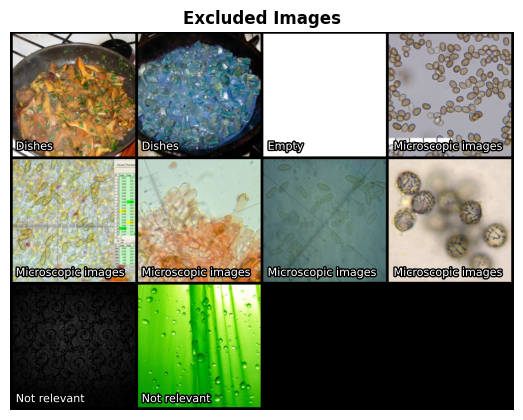

In [12]:
# | label: fig-removed-1
# | fig-cap: 'Images removed as irrelevant. Resized ad cropped to 224x224.'
# | code-summary: Code of the figure
# | code-fold: true

irrelevant = DataModule(
    data_dir="data/raw_removed/",
    train_val_test_splits=False,
    batch_size=32,  # big enough to show all images
    resize_to=224,
    exclude_classes=["Duplicates", "Corrupted"],
)
irrelevant.prepare_data()
irrelevant.setup()

# Get one batch of images
for images, class_codes, _ in irrelevant.test_dataloader():
    break

plot_grid_of_images(
    images,
    class_codes,
    list_of_class_labels=irrelevant.class_labels,
    figsize=(6.5, 6.5),
)
plt.title("Excluded Images")

del irrelevant, images, class_codes

In the further stages of the analysis, image `Russula/092_43B354vYxm8.png` caused the following error "image file is truncated (92 bytes not processed)" (@fig-corrupted-image) so it was also **removed**.

![Print-screen of the problematic image. Corrupted/Missing pixels are in green.](img/2024-01-28--00-22-42.png){#fig-corrupted-image}


Some pictures contained extremely zoomed-in parts of the mushroom, pictures with frames of different colors (white, yellow), pictures that contain annotations (circles, words, arrows, etc.), several stacked pictures on the same image, different items (e.g., knife, human palm, bucket, etc.). These were suspicious pictures, but they were **kept** in the dataset.


One more *note on dataset quality/experiment design*: not all the genera of investigation have pictures of mushrooms in certain scenarios and if in the future other genera will be tested in the future in these conditions, this might lead to a bias in the results. E.g., not all genera have pictures of mushrooms in the following scenarios:

- certain zoomed-in parts of a mushroom, e.g., gills, stems, hyphae, etc.
- certain mycological tests on mushrooms, e.g., certain types of mushroom cuts (e.g., cut in half from top to bottom or vertically), certain scratch/cut/press tests, which may result in a genera-specific color change, etc.
- mushrooms in certain non-natural backgrounds, e.g., on a human palm, on a grey background, etc.
- mushrooms in certain lighting conditions, e.g., in the dark.


## EDA of Sets and Classes


Files that were not excluded after manual, inspection were moved to the folder `data/raw_ok/`.

There are **9 classes** (genera) of mushrooms in the dataset (from 311 to 1502 files per class, so there is _class imbalance_), **6634 files** in total.


In [13]:
%%bash

dir_path="data/raw_ok/"

echo "Directory: $dir_path"
echo "----------------------------------------------------------"
echo "Number of files per subdirectory (i.e., per target class): "
echo ""

total_files=0
for folder in "$dir_path"/*; do
    if [ -d "$folder" ]; then
        folder_name=$(basename "$folder")
        files_count=$(find "$folder" -maxdepth 1 -type f | wc --lines)
        total_files=$((total_files + files_count))
        total_folders=$((total_folders + 1))
        printf "%-12s - %d\n" "$folder_name" "$files_count"
    fi
done

echo "----------------------------------------------------------"
echo "Total Subdirectories (classes): $total_folders"
echo "Total Files: $total_files"

Directory: data/raw_ok/
----------------------------------------------------------
Number of files per subdirectory (i.e., per target class): 

Agaricus     - 350
Amanita      - 748
Boletus      - 1067
Cortinarius  - 834
Entoloma     - 364
Hygrocybe    - 315
Lactarius    - 1502
Russula      - 1143
Suillus      - 311
----------------------------------------------------------
Total Subdirectories (classes): 9
Total Files: 6634


Let's inspect the metadata (i.e., data, associated with the images).
Class `DataModule` creates a data frame with metadata of the images:
path to the image, file size, dimensions, color channels, etc.
@tbl-eda-metadata-1 shows several rows of this metadata dataset.

The class also does a **stratified split** (by genus) to training, validation, and test
sets. You can explore this fact in @fig-n-img-per-class (see relative heights of the bars).


In [14]:
# Import for EDA purposes only
mushrooms_raw = DataModule(
    data_dir="data/raw_ok/",
    batch_size=64,  # batch size for EDA
    train_val_test_splits=(0.6, 0.2, 0.2),
    random_state=42,
    resize_to=256,
)
mushrooms_raw.prepare_data()
mushrooms_raw.setup()

metadata = mushrooms_raw.metadata

In [15]:
# | label: tbl-eda-metadata-1
# | tbl-cap: 'A few rows of metadata file.'
# | code-summary: Code of the table
# | code-fold: true

metadata.head()

,set,class_label,class_code,file,size_kb,width,height,format,mode
0,test,Agaricus,0,data/raw_ok/Agaricus/000_ePQknW8cTp8.jpg,71.75,778,600,JPEG,RGB
1,validation,Agaricus,0,data/raw_ok/Agaricus/001_2jP9N_ipAo8.jpg,162.22,700,525,JPEG,RGB
2,train,Agaricus,0,data/raw_ok/Agaricus/002_hNh3aQSH-ZM.jpg,138.18,700,524,JPEG,RGB
3,train,Agaricus,0,data/raw_ok/Agaricus/003_4AurAO4Jil8.jpg,179.73,800,600,JPEG,RGB
4,validation,Agaricus,0,data/raw_ok/Agaricus/004_Syi3NxxviC0.jpg,104.66,750,563,JPEG,RGB


In [16]:
# For plotting
set_order = ["train", "validation", "test"]

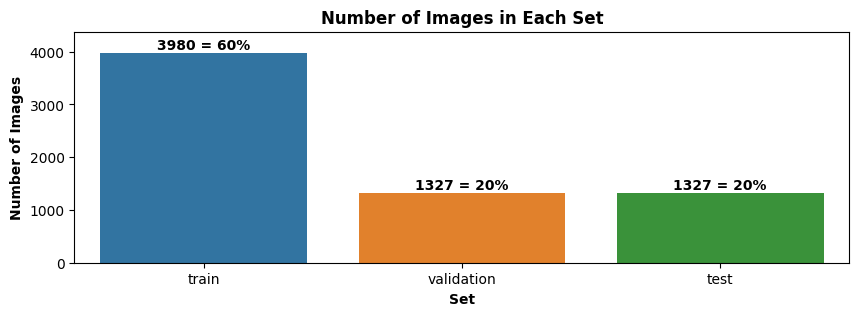

In [17]:
# | label: fig-n-img-per-set
# | fig-cap: 'Number of images in each set.'
# | code-summary: Code
# | code-fold: true


ax = sns.countplot(
    data=metadata, x="set", hue="set", order=set_order, hue_order=set_order
)
plt.title("Number of Images in Each Set")
plt.xlabel("Set")
plt.ylabel("Number of Images")
plt.ylim(0, 1.1 * metadata["set"].value_counts().max())

# Add percentages
total = len(metadata)
for p in ax.patches:
    height = p.get_height()
    percentage = height / total * 100
    ax.annotate(
        f"{int(height)} = {percentage:.0f}%",
        (p.get_x() + p.get_width() / 2, height),
        ha="center",
        va="bottom",
        weight="bold",
    )

The **split** into training, validation, and test sets **is stratified** by genus (i.e., by class):


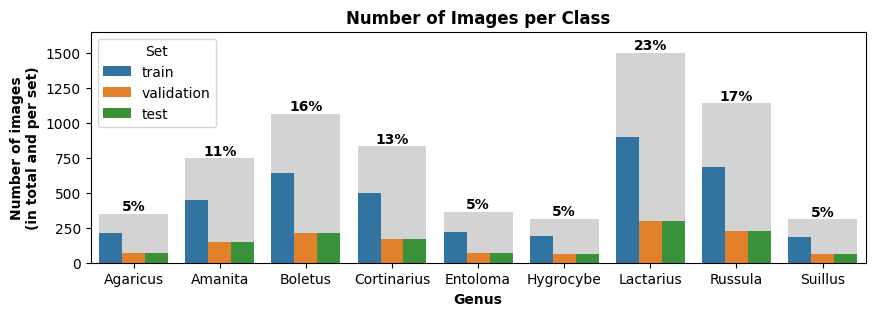

In [18]:
# | label: fig-n-img-per-class
# | fig-cap: 'Number of images per class.
# |     Grey bars show the number of images in each class (in total).
# |     Colored bars show the number of images in each class per set.
# |     **Class imbalance** and **stratified split** are visible.'
# | code-summary: Code
# | code-fold: true

ax = sns.countplot(x="class_label", data=metadata, color="lightgrey")
plt.ylim(0, 1.1 * metadata["class_label"].value_counts().max())

# Add percentages
total = len(metadata)
for p in ax.patches:
    height = p.get_height()
    percentage = height / total * 100
    ax.annotate(
        f"{percentage:.0f}%",
        (p.get_x() + p.get_width() / 2, height),
        ha="center",
        va="bottom",
        weight="bold",
    )

# Add sub-bars of sets
sns.countplot(x="class_label", hue="set", data=metadata, ax=ax, hue_order=set_order)
ax.title.set_text("Number of Images per Class")
ax.set_xlabel("Genus")
ax.set_ylabel("Number of images\n(in total and per set)")
ax.legend(title="Set", loc="upper left")
plt.show()

Before continuing, let's add a column with the minimum dimension (either width or height) which might be beneficial for inspecting metadata of small images:


In [19]:
metadata = metadata.assign(
    min_width_height=lambda df: df[["width", "height"]].min(axis=1)
)

## EDA of Image Metadata


All images are **JPEG** files in **RGB** color space (3 channels).
Image **size** ranges from approximately **7.5 to 586.9 kB**, **width** from **259 to 1280 pixels**, and **height** from **152 to 1024 pixels**. Graphical analysis shows a slight right skew of image size distributions. The trend that in some groups are only small or only big images, is not visible. In most cases, image sizes are between 100 and 200 kB. The largest image is up to 600 kB. There is a slight variation between groups, but resizing should unify the image sizes. It is planned to first resize images to make the smaller dimension equal to 256 and later to make a 224x224 crop. Further inspection reveals that there are 24 (0.4%) images with a smaller dimension of less than 256 pixels (find the details below): in all cases, the issue is to small height (see @tbl-small-images and the related figures).

Please, find the details below.


In [20]:
metadata.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Index: 6634 entries, 0 to 6633
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   set               6634 non-null   object  
 1   class_label       6634 non-null   category
 2   class_code        6634 non-null   int8    
 3   file              6634 non-null   object  
 4   size_kb           6634 non-null   float64 
 5   width             6634 non-null   int64   
 6   height            6634 non-null   int64   
 7   format            6634 non-null   object  
 8   mode              6634 non-null   object  
 9   min_width_height  6634 non-null   int64   
dtypes: category(1), float64(1), int64(3), int8(1), object(4)
memory usage: 479.8+ KB


In [21]:
metadata.nunique()

set                    3
class_label            9
class_code             9
file                6634
size_kb             6519
width                363
height               505
format                 1
mode                   1
min_width_height     506
dtype: int64

Note: the **grey bars** in the table below are proportional to the value size in the cell.

In [22]:
# | code-fold: true

(
    metadata.describe()
    .drop("count")
    .drop(columns=["class_code"])
    .T.assign(range=lambda df: df["max"] - df["min"])
    .T.style.format(precision=1)
    .bar(color="#aaa")
)

,size_kb,width,height,min_width_height
mean,144.6,796.2,580.0,576.7
std,59.1,133.0,100.5,99.3
min,7.5,259.0,152.0,152.0
25%,108.1,800.0,533.0,532.0
50%,142.2,800.0,581.0,573.0
75%,172.6,800.0,600.0,600.0
max,586.9,1280.0,1024.0,1024.0
range,579.4,1021.0,872.0,872.0


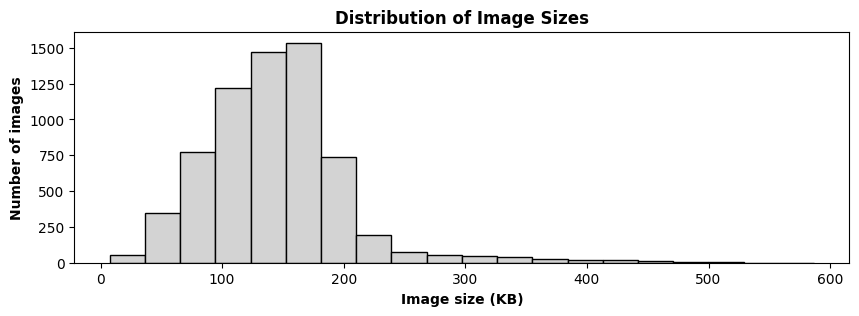

In [23]:
# | code-summary: Code
# | code-fold: true

metadata["size_kb"].plot.hist(bins=20, ec="black", color="lightgrey")
plt.title("Distribution of Image Sizes")
plt.xlabel("Image size (KB)")
plt.ylabel("Number of images")
plt.show()

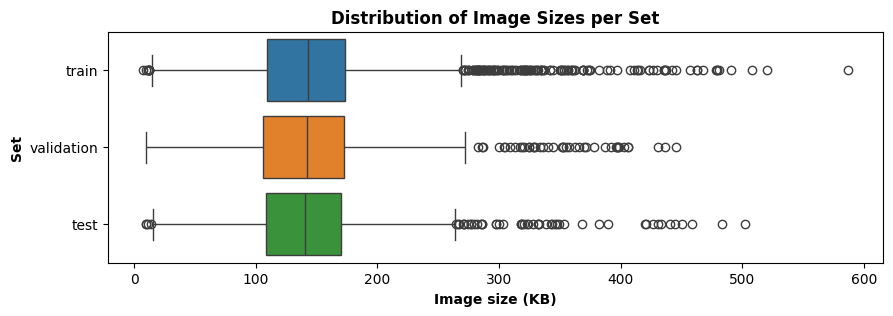

In [24]:
# | code-summary: Code
# | code-fold: true

sns.boxplot(
    data=metadata, y="set", x="size_kb", hue="set", order=set_order, hue_order=set_order
)
plt.title("Distribution of Image Sizes per Set")
plt.ylabel("Set")
plt.xlabel("Image size (KB)")
plt.show()

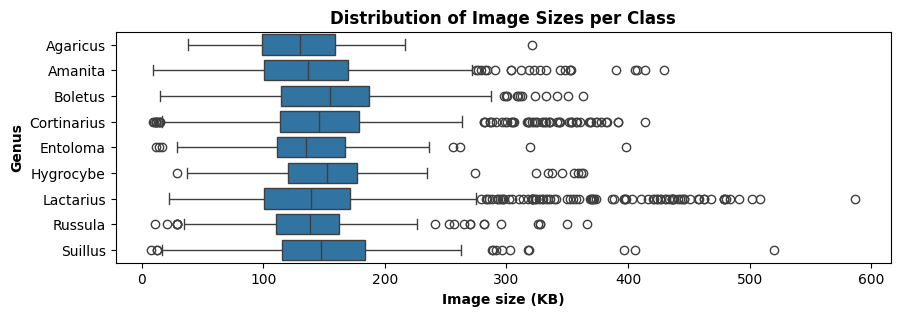

In [25]:
# | code-summary: Code
# | code-fold: true

sns.boxplot(data=metadata, y="class_label", x="size_kb")
plt.title("Distribution of Image Sizes per Class")
plt.ylabel("Genus")
plt.xlabel("Image size (KB)")
plt.show()

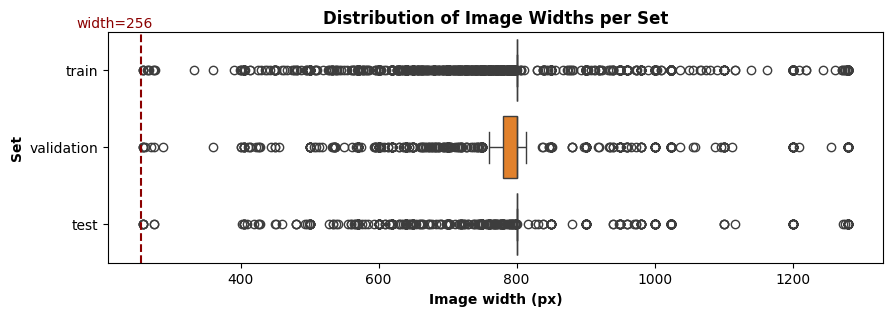

In [26]:
# | code-summary: Code
# | code-fold: true

sns.boxplot(
    data=metadata, y="set", x="width", order=set_order, hue="set", hue_order=set_order
)
plt.axvline(x=256, color="darkred", linestyle="--")
plt.text(218, -0.55, "width=256", color="darkred", ha="center")
plt.title("Distribution of Image Widths per Set")
plt.ylabel("Set")
plt.xlabel("Image width (px)")
plt.show()

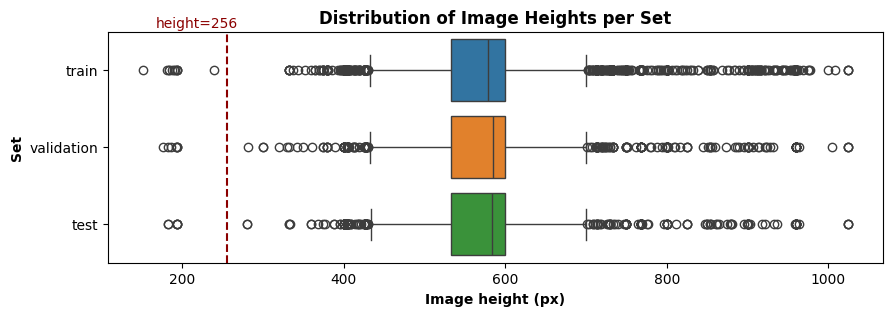

In [27]:
# | code-summary: Code
# | code-fold: true

sns.boxplot(
    data=metadata, y="set", x="height", order=set_order, hue="set", hue_order=set_order
)
plt.axvline(x=256, color="darkred", linestyle="--")
plt.text(218, -0.55, "height=256", color="darkred", ha="center")
plt.title("Distribution of Image Heights per Set")
plt.ylabel("Set")
plt.xlabel("Image height (px)")
plt.show()

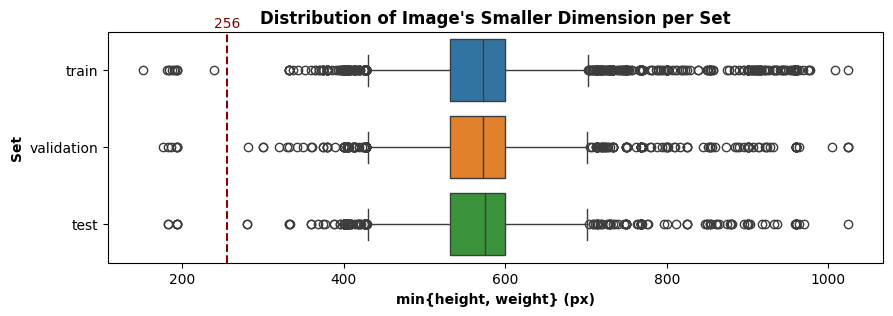

In [28]:
# | code-summary: Code
# | code-fold: true

sns.boxplot(
    data=metadata,
    y="set",
    x="min_width_height",
    order=set_order,
    hue="set",
    hue_order=set_order,
)
plt.axvline(x=256, color="darkred", linestyle="--")
plt.text(256, -0.55, "256", color="darkred", ha="center")
plt.title("Distribution of Image's Smaller Dimension per Set")
plt.ylabel("Set")
plt.xlabel("min{height, weight} (px)")
plt.show()

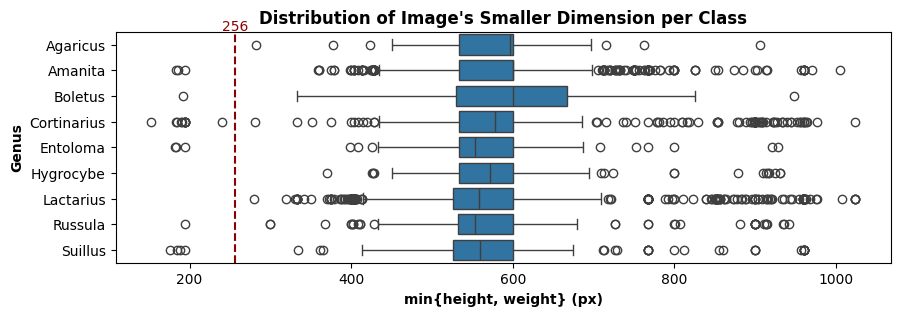

In [29]:
# | code-summary: Code
# | code-fold: true

sns.boxplot(data=metadata, y="class_label", x="min_width_height")
plt.axvline(x=256, color="darkred", linestyle="--")
plt.text(256, -0.55, "256", color="darkred", ha="center")
plt.title("Distribution of Image's Smaller Dimension per Class")
plt.ylabel("Genus")
plt.xlabel("min{height, weight} (px)")
plt.show()

In [30]:
metadata_less_256 = metadata.query("width < 256 | height < 256")
print(
    "Number of images with smaller dimension (either width or height) less than 256 px: \n"
    f"{len(metadata_less_256)} out of {len(metadata)} "
    f"({len(metadata_less_256)/len(metadata):.1%})"
)

Number of images with smaller dimension (either width or height) less than 256 px: 
24 out of 6634 (0.4%)


In [31]:
# | label: tbl-small-images
# | tbl-cap: 'Metadata of images with smaller dimension (either width or height)
# |    less than 256 px. Values **in yellow** are **less than 256 px**.
# |    The table indicates that in all cases the *problematic dimension is height*.
# |    The issue persist in all sets and most classes.'
# | code-summary: Code of the table
# | code-fold: true

metadata_less_256.style.map(
    lambda x: "background-color: yellow" if x < 256 else "",
    subset=["width", "height", "min_width_height"],
).format(precision=1)

,set,class_label,class_code,file,size_kb,width,height,format,mode,min_width_height
738,train,Amanita,1,data/raw_ok/Amanita/406_XzBTfW6Y0fg.jpg,11.6,259,194,JPEG,RGB,194
979,validation,Amanita,1,data/raw_ok/Amanita/658_q433U59ObdA.jpg,9.5,270,186,JPEG,RGB,186
1088,test,Amanita,1,data/raw_ok/Amanita/778_PisjukL0TOc.jpg,9.7,275,183,JPEG,RGB,183
1790,validation,Boletus,2,data/raw_ok/Boletus/0708_6VcekFRwMdg.jpg,15.2,262,192,JPEG,RGB,192
2251,test,Cortinarius,3,data/raw_ok/Cortinarius/095_1P7gu8fzldg.jpg,16.9,259,194,JPEG,RGB,194
2265,validation,Cortinarius,3,data/raw_ok/Cortinarius/112_26LUzyfI1nk.jpg,15.4,259,194,JPEG,RGB,194
2275,train,Cortinarius,3,data/raw_ok/Cortinarius/123_d68nNwG_WC8.jpg,14.4,259,194,JPEG,RGB,194
2404,train,Cortinarius,3,data/raw_ok/Cortinarius/266_y3AyAuEFapc.jpg,11.9,274,184,JPEG,RGB,184
2414,train,Cortinarius,3,data/raw_ok/Cortinarius/277_2vcjLHvzssg.jpg,11.4,266,190,JPEG,RGB,190
2546,test,Cortinarius,3,data/raw_ok/Cortinarius/421_cnHvD4ephAc.jpg,15.5,259,194,JPEG,RGB,194


In [32]:
del mushrooms_raw, metadata

## EDA of Metadata After Resizing


To avoid repetitive resizing and make images smaller (which may save data loading time), images were resized to have a smaller dimension of 256 pixels and the copies were saved in the folder `data/resized_256/`. After this procedure,
the data **directory size diminished** from 951 MB to 154 MB (**~6.2 times**). Figure size (in kB) distribution became symmetric. Figure size distributions per genus show slight differences in means (up to 2.6 kB) but no extreme discrepancies were found.


In [33]:
# Perform only once (if target directory doesn't exist)
if not os.path.exists("data/resized_256/"):
    copy_and_resize_images(
        source_dir="data/raw_ok/", target_dir="data/resized_256/", target_size=256
    )

In [34]:
%%bash
dir_paths=("data/raw_ok/" "data/resized_256/")

echo "Directory sizes:"
echo "---------------------------"

for dir_path in "${dir_paths[@]}"; do
    dir_size_mb=$(du -m -s "$dir_path" | cut -f1)
    echo "${dir_size_mb} MB    $dir_path"
done

Directory sizes:
---------------------------
951 MB    data/raw_ok/
154 MB    data/resized_256/


In [35]:
# Dir size ratio
np.round(951 / 154, 1)

6.2

It seams, that all files were copied:

In [36]:
%%bash

dir_path="data/resized_256/"

echo "Directory: $dir_path"
echo "----------------------------------------------------------"
echo "Number of files per subdirectory (i.e., per target class): "
echo ""

total_files=0
for folder in "$dir_path"/*; do
    if [ -d "$folder" ]; then
        folder_name=$(basename "$folder")
        files_count=$(find "$folder" -maxdepth 1 -type f | wc --lines)
        total_files=$((total_files + files_count))
        total_folders=$((total_folders + 1))
        printf "%-12s - %d\n" "$folder_name" "$files_count"
    fi
done

echo "----------------------------------------------------------"
echo "Total Subdirectories (classes): $total_folders"
echo "Total Files: $total_files"

Directory: data/resized_256/
----------------------------------------------------------
Number of files per subdirectory (i.e., per target class): 

Agaricus     - 350
Amanita      - 748
Boletus      - 1067
Cortinarius  - 834
Entoloma     - 364
Hygrocybe    - 315
Lactarius    - 1502
Russula      - 1143
Suillus      - 311
----------------------------------------------------------
Total Subdirectories (classes): 9
Total Files: 6634


In [37]:
mushrooms_resized = DataModule(
    data_dir="data/resized_256/",
    train_val_test_splits=(0.6, 0.2, 0.2),
    random_state=42,
)
mushrooms_resized.prepare_data()
mushrooms_resized.setup()

metadata_resized = mushrooms_resized.metadata.assign(
    min_width_height=lambda df: df[["width", "height"]].min(axis=1)
)

In [38]:
metadata_resized.head()

,set,class_label,class_code,file,size_kb,width,height,format,mode,min_width_height
0,test,Agaricus,0,data/resized_256/Agaricus/000_ePQknW8cTp8.jpg,15.87,331,256,JPEG,RGB,256
1,validation,Agaricus,0,data/resized_256/Agaricus/001_2jP9N_ipAo8.jpg,24.67,341,256,JPEG,RGB,256
2,train,Agaricus,0,data/resized_256/Agaricus/002_hNh3aQSH-ZM.jpg,21.06,341,256,JPEG,RGB,256
3,train,Agaricus,0,data/resized_256/Agaricus/003_4AurAO4Jil8.jpg,21.87,341,256,JPEG,RGB,256
4,validation,Agaricus,0,data/resized_256/Agaricus/004_Syi3NxxviC0.jpg,18.27,341,256,JPEG,RGB,256


The summary of the metadata of resized images:

In [39]:
# | code-fold: true

(
    metadata_resized.describe()
    .drop("count")
    .drop(columns=["class_code"])
    .T.assign(range=lambda df: df["max"] - df["min"])
    .T.style.format(precision=1)
    .bar(color="#aaa")
)

,size_kb,width,height,min_width_height
mean,21.6,354.6,257.6,256.0
std,4.2,33.0,12.2,0.0
min,5.9,256.0,256.0,256.0
25%,19.1,341.0,256.0,256.0
50%,21.8,342.0,256.0,256.0
75%,24.3,383.0,256.0,256.0
max,40.9,731.0,456.0,256.0
range,34.9,475.0,200.0,0.0


The summary by genus:

In [40]:
metadata_resized.groupby("class_label", observed=False).agg({
    "size_kb": ["mean", "median", "std"],
    "min_width_height": ["mean", "median", "std"],
}).style.format(precision=1)

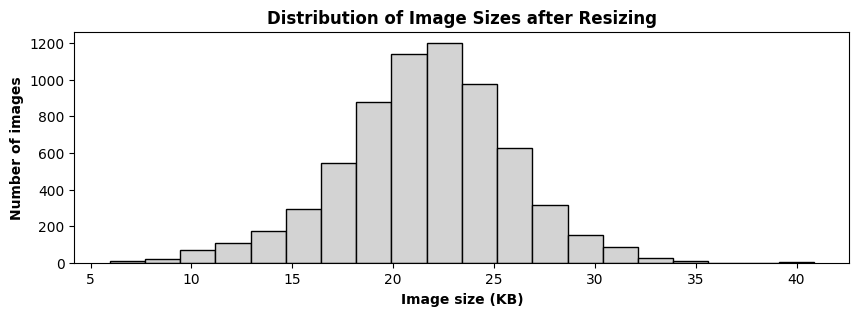

In [41]:
# | code-summary: Code
# | code-fold: true

metadata_resized["size_kb"].plot.hist(bins=20, ec="black", color="lightgrey")
plt.title("Distribution of Image Sizes after Resizing")
plt.xlabel("Image size (KB)")
plt.ylabel("Number of images")
plt.show()

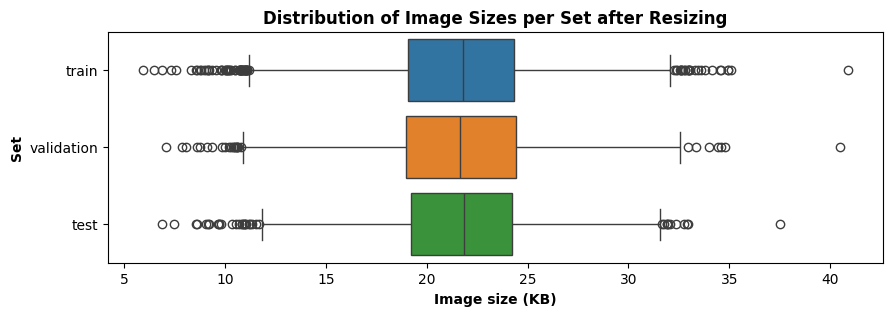

In [42]:
# | code-summary: Code
# | code-fold: true

sns.boxplot(
    data=metadata_resized,
    y="set",
    x="size_kb",
    hue="set",
    order=set_order,
    hue_order=set_order,
)
plt.title("Distribution of Image Sizes per Set after Resizing")
plt.ylabel("Set")
plt.xlabel("Image size (KB)")
plt.show()

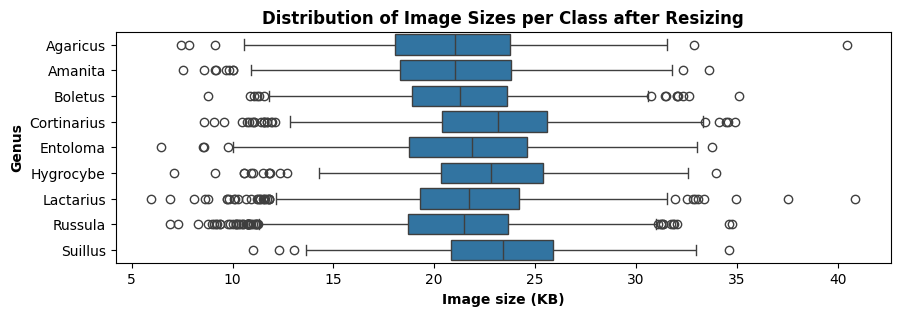

In [43]:
# | code-summary: Code
# | code-fold: true

sns.boxplot(data=metadata_resized, y="class_label", x="size_kb")
plt.title("Distribution of Image Sizes per Class after Resizing")
plt.ylabel("Genus")
plt.xlabel("Image size (KB)")
plt.show()

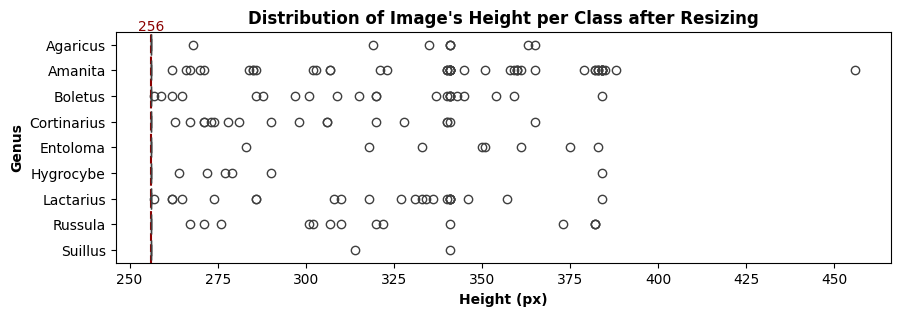

In [44]:
# | code-summary: Code
# | code-fold: true

sns.boxplot(data=metadata_resized, y="class_label", x="height")
plt.axvline(x=256, color="darkred", linestyle="--")
plt.text(256, -0.55, "256", color="darkred", ha="center")
plt.title("Distribution of Image's Height per Class after Resizing")
plt.ylabel("Genus")
plt.xlabel("Height (px)")
plt.show()

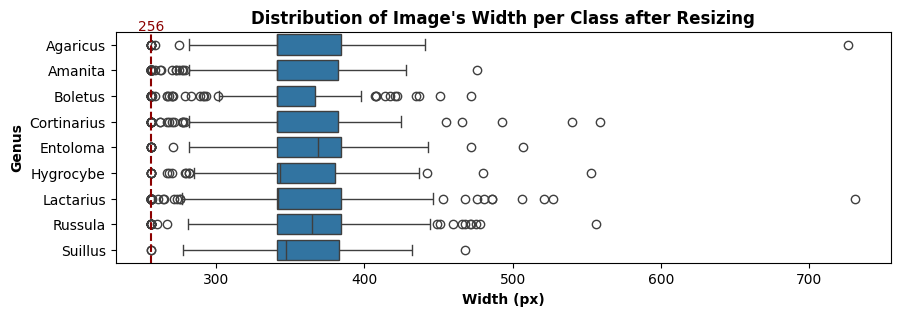

In [45]:
# | code-summary: Code
# | code-fold: true

sns.boxplot(data=metadata_resized, y="class_label", x="width")
plt.axvline(x=256, color="darkred", linestyle="--")
plt.text(256, -0.55, "256", color="darkred", ha="center")
plt.title("Distribution of Image's Width per Class after Resizing")
plt.ylabel("Genus")
plt.xlabel("Width (px)")
plt.show()

## EDA of Images


This section presents a few 64-image batches of resized and processed images:

1) one example of the raining set (see @fig-eda-training-set) as images are shuffled (as well as augmented) and more variety is visible in a single batch;
2) several examples of the validation set (see @fig-eda-validation-set) as images are in the sequential order and to see more classes, more batches are needed.

In the **training set**, images are:

1. **resized** to 256 (the smallest dimension):
2. **shuffled** in a random order;
3. then **augmented** by various transformations:
   - random horizontal flip;
   - random rotation up to 60 degrees;
   - random perspective distortion;
   - random brightness, contrast, and saturation adjustments;
   - random image sharpness adjustments;
4. then **cropped** to **224x224** at **random** location;
5. then converted to PyTorch tensors;
6. then **normalized** by the mean and standard deviation of the ImageNet dataset.


In @fig-eda-training-set, an example of 64-image batch from the training set is illustrated. Pay attention to:

1. the random order of class names;
2. random transformations applied to the images. The rotation which leaves random black areas is especially noticeable.


Seed set to 42


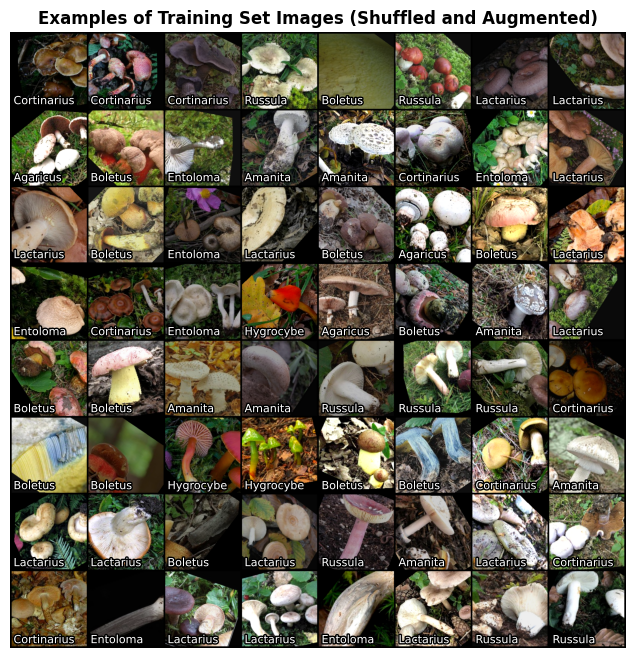

In [46]:
# | label: fig-eda-training-set
# | fig-cap: '**A batch of 64 training set images.**
# |     The images are **shuffled** in a random order and **augmented**
# |     with various randomly applied transformations.'
# | code-summary: Code of the figure
# | code-fold: true

L.seed_everything(42)
i = 0
mushrooms_resized.batch_size = 64

for images, class_codes, _ in mushrooms_resized.train_dataloader():
    i += 1
    plot_grid_of_images(
        images, class_codes, list_of_class_labels=mushrooms_resized.class_labels
    )
    plt.title("Examples of Training Set Images (Shuffled and Augmented)")
    break

del images, class_codes, i

In the **validation and test sets**, images are:

1. **resized** to 256 (the smallest dimension);
2. then **cropped** to **224x224** at the image **center**;
3. then converted to PyTorch tensors;
4. then **normalized** by the mean and standard deviation of the ImageNet dataset.


In @fig-eda-validation-set, 8 random examples per genus (manually sorted) from the validation set are illustrated. Analogous information from the test set is presented in @fig-eda-test-set.

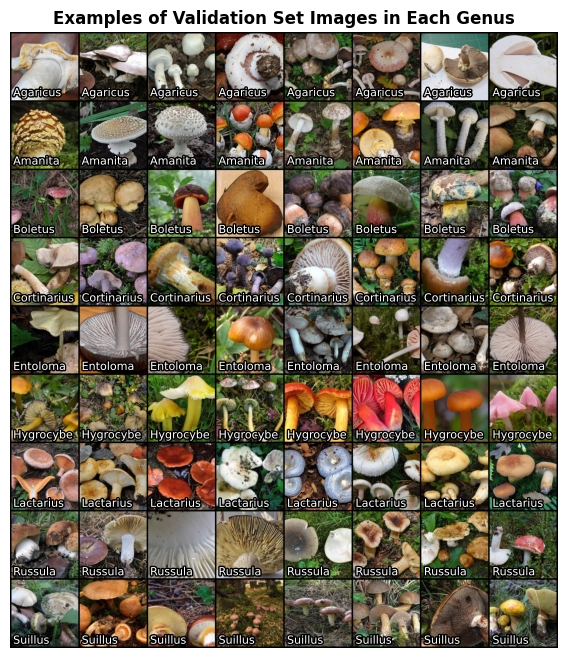

In [47]:
# | label: fig-eda-validation-set
# | fig-cap: '**Examples of the validation set images in each genus.**'
# | code-summary: Code of the figure
# | code-fold: true

n_per_class = 8

val_preview = deepcopy(mushrooms_resized)
val_preview.batch_size = n_per_class * 9
val_preview.metadata = (
    val_preview.metadata.query("set == 'validation'")
    .sample(frac=1, random_state=42)
    .groupby("class_code")
    .head(n_per_class)
    .sort_values("class_label")
)
val_preview.setup()

for images, class_codes, _ in val_preview.val_dataloader():
    plot_grid_of_images(
        images,
        class_codes,
        list_of_class_labels=val_preview.class_labels,
        n_cols=n_per_class,
    )
    plt.title("Examples of Validation Set Images in Each Genus")

del val_preview, images, class_codes

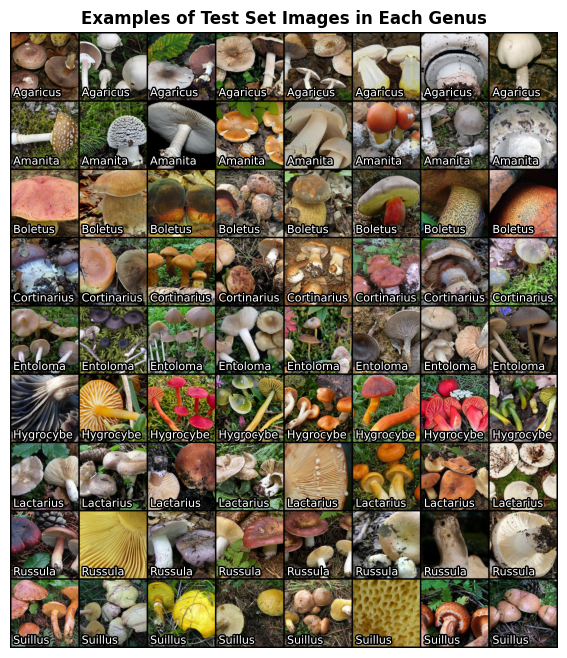

In [48]:
# | label: fig-eda-test-set
# | fig-cap: '**Examples of the test set images in each genus.**'
# | code-summary: Code of the figure
# | code-fold: true

n_per_class = 8

test_preview = deepcopy(mushrooms_resized)
test_preview.batch_size = n_per_class * 9
test_preview.metadata = (
    test_preview.metadata.query("set == 'test'")
    .sample(frac=1, random_state=42)
    .groupby("class_code")
    .head(n_per_class)
    .sort_values("class_label")
)
test_preview.setup()

for images, class_codes, _ in test_preview.test_dataloader():
    plot_grid_of_images(
        images,
        class_codes,
        list_of_class_labels=test_preview.class_labels,
        n_cols=n_per_class,
    )
    plt.title("Examples of Test Set Images in Each Genus")
    break

del test_preview, images, class_codes

To make sure, that the validation and test data loaders import images in the sequential (non-shuffled) order, several 64-image batches are plotted in @fig-eda-validation-set-5-batches and @fig-eda-test-set-5-batches, which ace in the collapsible sections below.

::: {.content-hidden when-format="html"}

---

Start of the collapsible section 
`<details>`

:::

<details class="with-border">
<summary>More examples from the validation set. </summary>

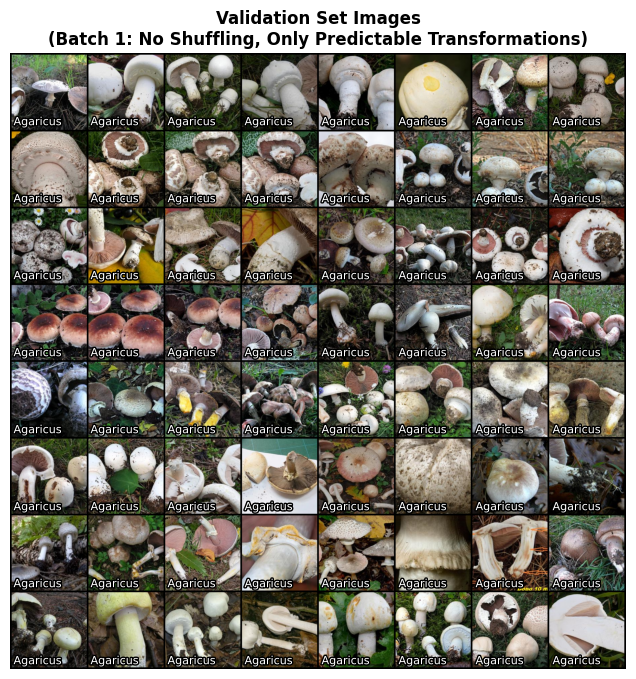

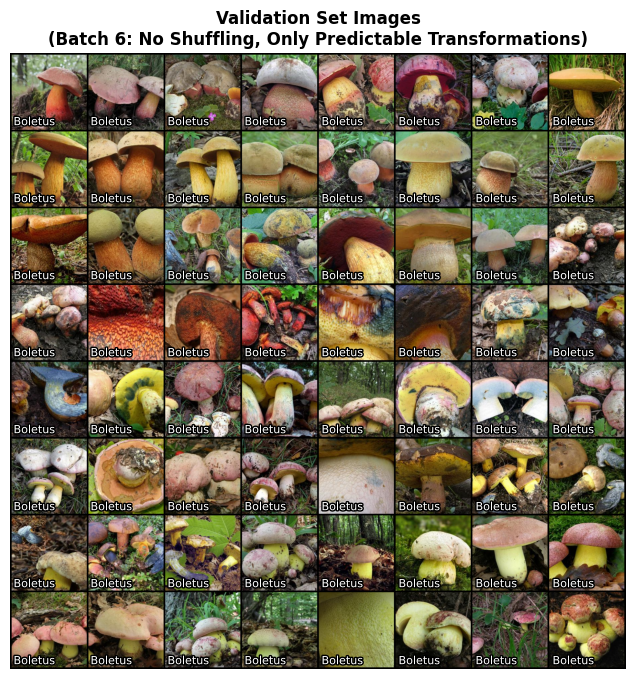

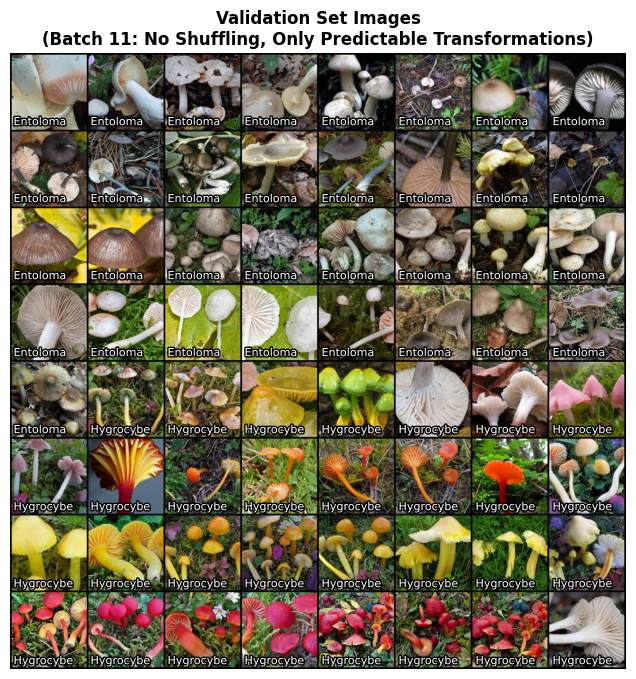

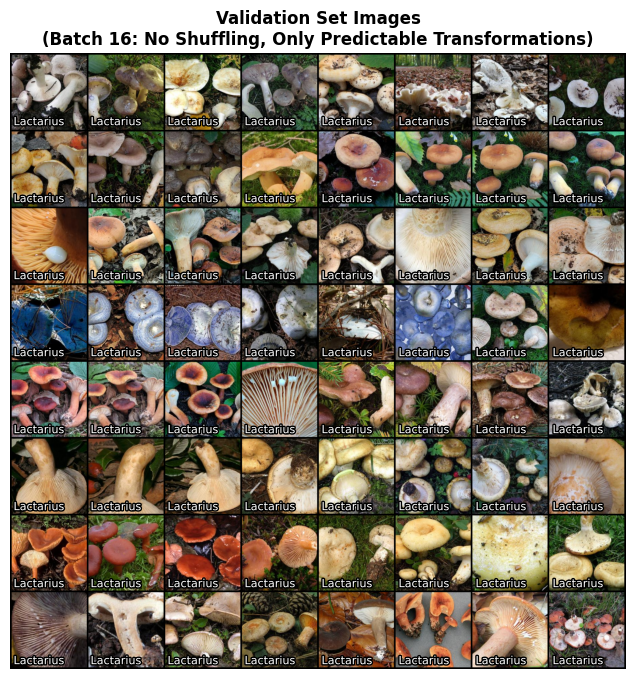

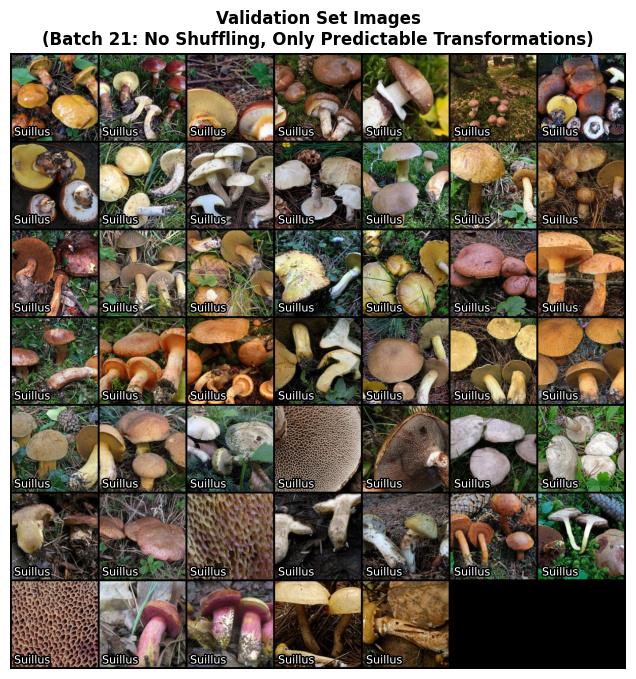

In [49]:
# | label: fig-eda-validation-set-5-batches
# | fig-cap: '**A few 64-image batches of the validation set images.**
# |     The images are in the **original order** (not shuffled) and with only
# |     necessary **stable and predictable transformations** applied.
# |     The same transformations are be applied to the test set images too.'
# | fig-subcap:
# |   - "Batch 1"
# |   - "Batch 6"
# |   - "Batch 11"
# |   - "Batch 16"
# |   - "Batch 21"
# | code-summary: Code of the figure
# | code-fold: true

i = 0
for images, class_codes, _ in mushrooms_resized.val_dataloader():
    i += 1
    # Every 5-th starting at 1
    if (i - 1) % 5 == 0:
        plot_grid_of_images(
            images, class_codes, list_of_class_labels=mushrooms_resized.class_labels
        )
        plt.title(
            "Validation Set Images\n"
            f"(Batch {i}: No Shuffling, Only Predictable Transformations)"
        )

    if i > 21:
        break

del images, class_codes, i

</details>


::: {.content-hidden when-format="html"}

`</details>` 
End of the collapsible section

---

:::

::: {.content-hidden when-format="html"}

---

Start of the collapsible section 
`<details>`

:::

<details class="with-border">
<summary>More examples from the test set. </summary>

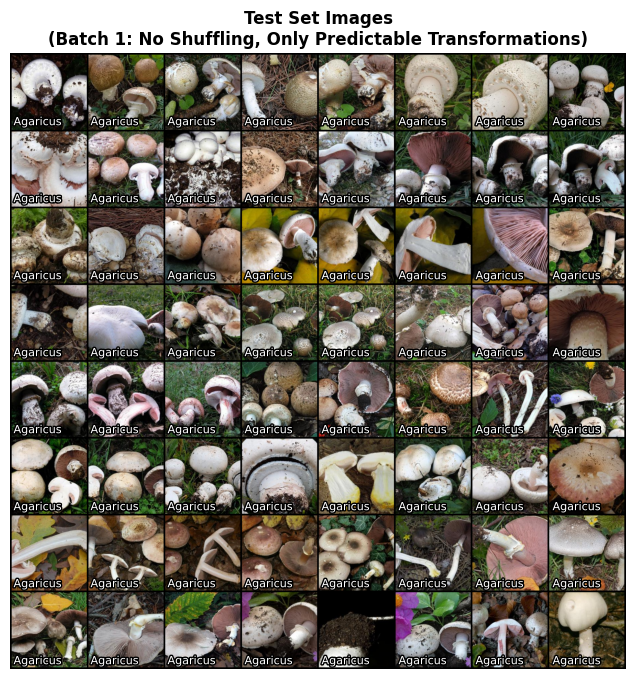

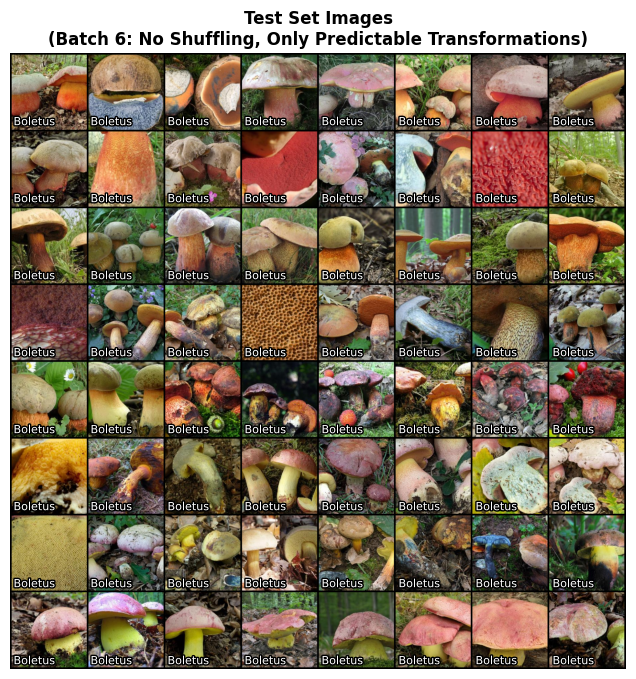

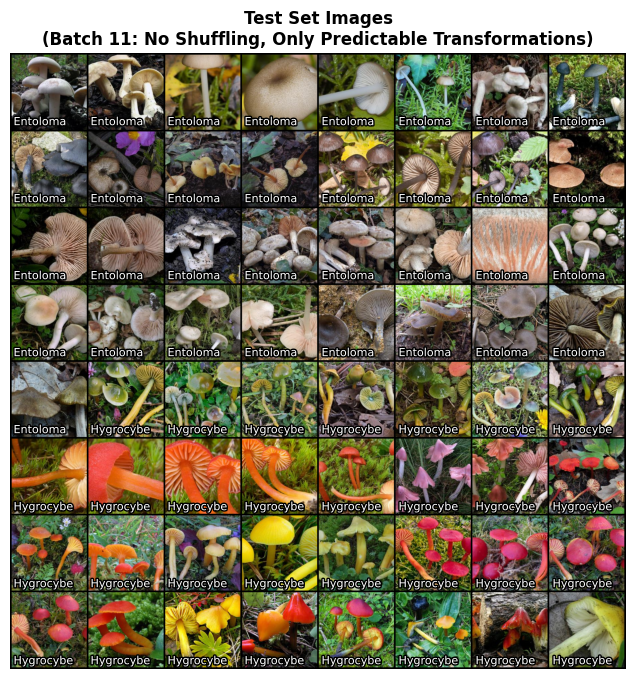

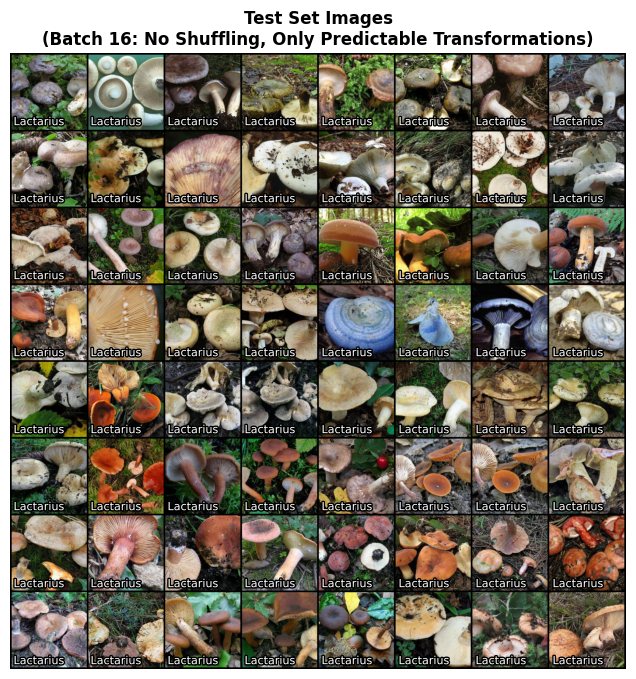

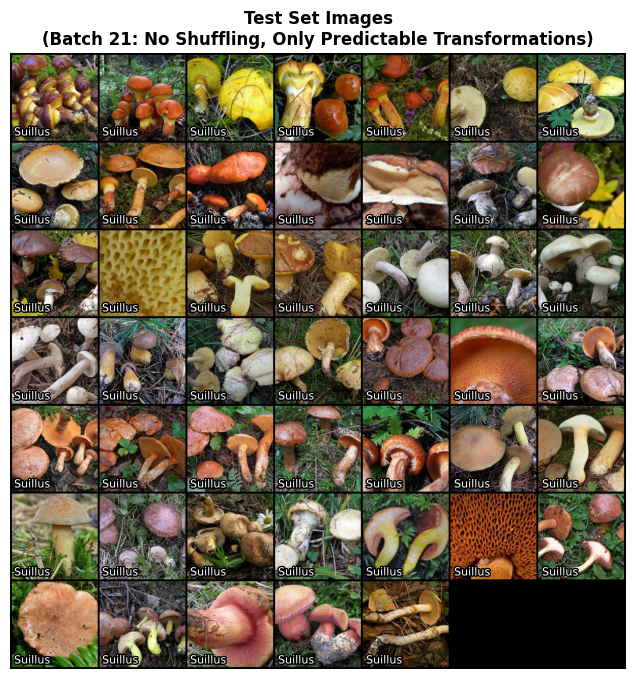

In [50]:
# | label: fig-eda-test-set-5-batches
# | fig-cap: '**A few 64-image batches of the test set images.**
# |     The images are in the **original order** (not shuffled) and with only
# |     necessary **stable and predictable transformations** applied.
# |     The same transformations are be applied to the validation set images too.'
# | fig-subcap:
# |   - "Batch 1"
# |   - "Batch 6"
# |   - "Batch 11"
# |   - "Batch 16"
# |   - "Batch 21"
# | code-summary: Code of the figure
# | code-fold: true

i = 0
for images, class_codes, _ in mushrooms_resized.test_dataloader():
    i += 1
    # Every 5-th starting at 1
    if (i - 1) % 5 == 0:
        plot_grid_of_images(
            images, class_codes, list_of_class_labels=mushrooms_resized.class_labels
        )
        plt.title(
            "Test Set Images\n"
            f"(Batch {i}: No Shuffling, Only Predictable Transformations)"
        )

    if i > 21:
        break

del images, class_codes, i

</details>


::: {.content-hidden when-format="html"}

`</details>` 
End of the collapsible section

---

:::

# Modeling


## Starting Point: *ResNet-18*

In this project, **4 models** (2 architectures with either all or just a few trainable layers) were developed. The models were trained using **transfer learning**: the ***ResNet-18*** model pre-trained on the ***ImageNet*** dataset was used as the starting point. The _pre-processing parameters_ that were used to pre-train the *ResNet-18* model were also used in this project:

In [51]:
# ResNet-18 pre-training protocol
models.ResNet18_Weights.IMAGENET1K_V1.transforms()

ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)

In [52]:
resnet18 = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)

The last layer of **Resnet-18* has 1000 outputs (one for each class) and this should be changed in this project as only 9 classes are used:


In [53]:
print(resnet18.fc)

Linear(in_features=512, out_features=1000, bias=True)


Find more details on *ResNet18* in the collapsible sections below.

::: {.content-hidden when-format="html"}

---

Start of the collapsible section
`<details>`

:::

<details class="with-border">
<summary>ResNet18 structure </summary>


Model structure with layer names:

In [54]:
print(resnet18)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

</details>

::: {.content-hidden when-format="html"}

`</details>`
End of the collapsible section

---

:::


::: {.content-hidden when-format="html"}

---

Start of the collapsible section
`<details>`

:::

<details class="with-border">
<summary>ResNet18 summary </summary>


A more detailed summary of the model:

<!-- NOTE: The code was not actually run in this session, as it takes GPU memory and does not release it. -->


```python
# Display model summary
summary(resnet18, (1, 3, 224, 224))
```

```
==========================================================================================
Layer (type:depth-idx)                   Output Shape              Param #
==========================================================================================
ResNet                                   [1, 1000]                 --
├─Conv2d: 1-1                            [1, 64, 112, 112]         9,408
├─BatchNorm2d: 1-2                       [1, 64, 112, 112]         128
├─ReLU: 1-3                              [1, 64, 112, 112]         --
├─MaxPool2d: 1-4                         [1, 64, 56, 56]           --
├─Sequential: 1-5                        [1, 64, 56, 56]           --
│    └─BasicBlock: 2-1                   [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-1                  [1, 64, 56, 56]           36,864
│    │    └─BatchNorm2d: 3-2             [1, 64, 56, 56]           128
│    │    └─ReLU: 3-3                    [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-4                  [1, 64, 56, 56]           36,864
│    │    └─BatchNorm2d: 3-5             [1, 64, 56, 56]           128
│    │    └─ReLU: 3-6                    [1, 64, 56, 56]           --
│    └─BasicBlock: 2-2                   [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-7                  [1, 64, 56, 56]           36,864
│    │    └─BatchNorm2d: 3-8             [1, 64, 56, 56]           128
│    │    └─ReLU: 3-9                    [1, 64, 56, 56]           --
│    │    └─Conv2d: 3-10                 [1, 64, 56, 56]           36,864
│    │    └─BatchNorm2d: 3-11            [1, 64, 56, 56]           128
│    │    └─ReLU: 3-12                   [1, 64, 56, 56]           --
├─Sequential: 1-6                        [1, 128, 28, 28]          --
│    └─BasicBlock: 2-3                   [1, 128, 28, 28]          --
│    │    └─Conv2d: 3-13                 [1, 128, 28, 28]          73,728
│    │    └─BatchNorm2d: 3-14            [1, 128, 28, 28]          256
│    │    └─ReLU: 3-15                   [1, 128, 28, 28]          --
│    │    └─Conv2d: 3-16                 [1, 128, 28, 28]          147,456
│    │    └─BatchNorm2d: 3-17            [1, 128, 28, 28]          256
│    │    └─Sequential: 3-18             [1, 128, 28, 28]          8,448
│    │    └─ReLU: 3-19                   [1, 128, 28, 28]          --
│    └─BasicBlock: 2-4                   [1, 128, 28, 28]          --
│    │    └─Conv2d: 3-20                 [1, 128, 28, 28]          147,456
│    │    └─BatchNorm2d: 3-21            [1, 128, 28, 28]          256
│    │    └─ReLU: 3-22                   [1, 128, 28, 28]          --
│    │    └─Conv2d: 3-23                 [1, 128, 28, 28]          147,456
│    │    └─BatchNorm2d: 3-24            [1, 128, 28, 28]          256
│    │    └─ReLU: 3-25                   [1, 128, 28, 28]          --
├─Sequential: 1-7                        [1, 256, 14, 14]          --
│    └─BasicBlock: 2-5                   [1, 256, 14, 14]          --
│    │    └─Conv2d: 3-26                 [1, 256, 14, 14]          294,912
│    │    └─BatchNorm2d: 3-27            [1, 256, 14, 14]          512
│    │    └─ReLU: 3-28                   [1, 256, 14, 14]          --
│    │    └─Conv2d: 3-29                 [1, 256, 14, 14]          589,824
│    │    └─BatchNorm2d: 3-30            [1, 256, 14, 14]          512
│    │    └─Sequential: 3-31             [1, 256, 14, 14]          33,280
│    │    └─ReLU: 3-32                   [1, 256, 14, 14]          --
│    └─BasicBlock: 2-6                   [1, 256, 14, 14]          --
│    │    └─Conv2d: 3-33                 [1, 256, 14, 14]          589,824
│    │    └─BatchNorm2d: 3-34            [1, 256, 14, 14]          512
│    │    └─ReLU: 3-35                   [1, 256, 14, 14]          --
│    │    └─Conv2d: 3-36                 [1, 256, 14, 14]          589,824
│    │    └─BatchNorm2d: 3-37            [1, 256, 14, 14]          512
│    │    └─ReLU: 3-38                   [1, 256, 14, 14]          --
├─Sequential: 1-8                        [1, 512, 7, 7]            --
│    └─BasicBlock: 2-7                   [1, 512, 7, 7]            --
│    │    └─Conv2d: 3-39                 [1, 512, 7, 7]            1,179,648
│    │    └─BatchNorm2d: 3-40            [1, 512, 7, 7]            1,024
│    │    └─ReLU: 3-41                   [1, 512, 7, 7]            --
│    │    └─Conv2d: 3-42                 [1, 512, 7, 7]            2,359,296
│    │    └─BatchNorm2d: 3-43            [1, 512, 7, 7]            1,024
│    │    └─Sequential: 3-44             [1, 512, 7, 7]            132,096
│    │    └─ReLU: 3-45                   [1, 512, 7, 7]            --
│    └─BasicBlock: 2-8                   [1, 512, 7, 7]            --
│    │    └─Conv2d: 3-46                 [1, 512, 7, 7]            2,359,296
│    │    └─BatchNorm2d: 3-47            [1, 512, 7, 7]            1,024
│    │    └─ReLU: 3-48                   [1, 512, 7, 7]            --
│    │    └─Conv2d: 3-49                 [1, 512, 7, 7]            2,359,296
│    │    └─BatchNorm2d: 3-50            [1, 512, 7, 7]            1,024
│    │    └─ReLU: 3-51                   [1, 512, 7, 7]            --
├─AdaptiveAvgPool2d: 1-9                 [1, 512, 1, 1]            --
├─Linear: 1-10                           [1, 1000]                 513,000
==========================================================================================
Total params: 11,689,512
Trainable params: 11,689,512
Non-trainable params: 0
Total mult-adds (Units.GIGABYTES): 1.81
==========================================================================================
Input size (MB): 0.60
Forward/backward pass size (MB): 39.75
Params size (MB): 46.76
Estimated Total Size (MB): 87.11
==========================================================================================
```

</details>

::: {.content-hidden when-format="html"}

`</details>`
End of the collapsible section

---

:::


## Common Steps

This part explains the steps that are common to training all the models.
During the training:

1) Model **architectures** were prepared:
    - required layers were replaced/added to the pre-trained model;
2) The required parts of the model were either **frozen** (i.e., made not trainable) or unfrozen;
3) Hyperparameters were selected:
   - first, **batch size** was selected to fit the GPU memory;
   - **learning rate** was selected using a learning rate finder;
   - max number of 400 epochs was set;
   - **early stopping** was used:
      - if the validation loss did not decrease for 3 epochs, the training was stopped (i.e., ***patience* is 3**);
      - 6 best versions of each model's weights were saved (**6 checkpoints**).
4) The model was trained and performance metrics were tracked using **TensorBoard**:
   - model performance metrics were calculated on the training and validation sets at the end of each epoch;
       1) **cross-entropy loss** (the average of the loss function values per batch);
       2) **balanced accuracy** (the macro average of correctly classified percentages of instances per class);
       3) **balanced accuracy \@Top 2** (the same as balanced accuracy, but "correct" is considered when the true class is in the top 2 predicted classes; so this metric is always better than the previous one);
   - Code profiling information was also tracked using **PyTorch Profiler**.
5) The performance of the models was compared.

Now let's perform 2 more common steps:

1) initiate data module `mushrooms`;
2) initiate `trainer` and `tuner` objects for hyperparameter search (max. batch size and optimal initial learning rate).

In the code, you can see all main pre-processing parameters:

In [55]:
mushrooms = DataModule(
    data_dir="data/resized_256/",
    crop=(224, 224),
    random_state=42,
    train_val_test_splits=(0.6, 0.2, 0.2),
    normalize={"mean": [0.485, 0.456, 0.406], "std": [0.229, 0.224, 0.225]},
)
mushrooms.prepare_data()
mushrooms.setup()

In [56]:
trainer = L.Trainer(max_epochs=10, accelerator="gpu", devices=[0])
tuner = Tuner(trainer)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


## Model 1


### Define

::: {.callout-note}

#### Summary: Model 1

- **base model:** _ResNet-18_ (pre-trained on the _ImageNet_ dataset)
- **replaced layers:** the last layer only
- **tuned layers:** the last (replaced) layer only (classifier)
- **batch size:** 256
- **learning rate:** 0.022387

:::


In this section, the ResNet-18 model is modified by replacing the last fully connected layer with a new one that has 9 output neurons (one for each class). During the tuning, all weights are frozen except in the new layer.


In [12]:
resnet18_mod1 = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)

# Freeze weights of the pre-trained model
for param in resnet18_mod1.parameters():
    param.requires_grad = False

# Replace the last fully-connected output layer
resnet18_mod1.fc = torch.nn.Linear(512, 9)

# Create lightning module
model_1 = NN(model=resnet18_mod1)

### Tune

In [ ]:
mushrooms.batch_size = 1
tuner.scale_batch_size(model_1, mode="power", datamodule=mushrooms)

<details class="with-border">
<summary>Output. Suggested max. batch size is 256. </summary>

```
The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.
The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.
`Trainer.fit` stopped: `max_steps=3` reached.
Batch size 2 succeeded, trying batch size 4
`Trainer.fit` stopped: `max_steps=3` reached.
Batch size 4 succeeded, trying batch size 8
`Trainer.fit` stopped: `max_steps=3` reached.
Batch size 8 succeeded, trying batch size 16
`Trainer.fit` stopped: `max_steps=3` reached.
Batch size 16 succeeded, trying batch size 32
`Trainer.fit` stopped: `max_steps=3` reached.
Batch size 32 succeeded, trying batch size 64
`Trainer.fit` stopped: `max_steps=3` reached.
Batch size 64 succeeded, trying batch size 128
The number of training batches (32) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
`Trainer.fit` stopped: `max_steps=3` reached.
Batch size 128 succeeded, trying batch size 256
The number of training batches (16) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
`Trainer.fit` stopped: `max_steps=3` reached.
Batch size 256 succeeded, trying batch size 512
The number of training batches (8) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
Batch size 512 failed, trying batch size 256
Finished batch size finder, will continue with full run using batch size 256
```

</details>

In [ ]:
lr_finder_1 = tuner.lr_find(model_1, datamodule=mushrooms, min_lr=1e-6, max_lr=1e-1)
# Time: 9m 36.8s

pd.DataFrame(lr_finder_1.results).to_csv("logs/lr_finder_1.csv")

Suggested learning rate: 0.022387


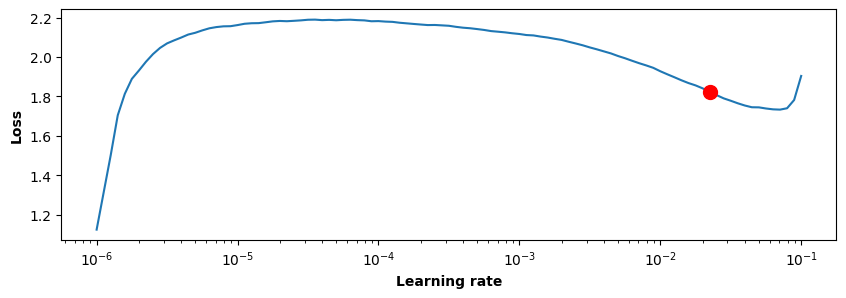

In [22]:
fig = lr_finder_1.plot(suggest=True)
new_lr = lr_finder_1.suggestion()
print(f"Suggested learning rate: {new_lr:.6f}")

### Train

In [ ]:
model_1.hparams.learning_rate = 0.022387
mushrooms.batch_size = 256

os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":4096:8"
trainer_1 = create_trainer("model-1")

with suppress_certain_logs_and_warnings():
    trainer_1.fit(model=model_1, datamodule=mushrooms)
# Time: 21m 29.8s

## Model 2


### Define

::: {.callout-note}

#### Summary: Model 2

- **base model:** _ResNet-18_ (pre-trained on the _ImageNet_ dataset)
- **replaced layers:** the last layer with 3 new layers
- **tuned layers:** the replaced layers only (classifier)
- **batch size:** 256
- **learning rate:** 0.003981

:::


In this section, the ResNet-18 model is modified by replacing the last fully connected layer with 3 new layers that have 256, 128 and 9 output neurons (one for each class), ReLU activation functions and drop-out layers in between the layers. During the tuning, all weights are frozen except in the 3 new layers.


In [27]:
resnet18_mod2 = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)

# Freeze weights of the pre-trained model
for param in resnet18_mod2.parameters():
    param.requires_grad = False

# Replace the last fully-connected layer
resnet18_mod2.fc = nn.Sequential(
    nn.Linear(512, 256),
    nn.ReLU(),
    nn.Dropout(0.4),
    nn.Linear(256, 128),
    nn.ReLU(),
    nn.Dropout(0.4),
    nn.Linear(128, 9),
)

# Lightning module
model_2 = NN(model=resnet18_mod2)

The output layer:

In [53]:
print(resnet18_mod2.fc[6])

Linear(in_features=128, out_features=9, bias=True)


### Tune

The same batch size (256) as in the previous model is used.  

In [ ]:
mushrooms.batch_size = 256

In [ ]:
lr_finder_2 = tuner.lr_find(model_2, datamodule=mushrooms, min_lr=1e-6, max_lr=1e-1)
# Time: 10m 13.9s

pd.DataFrame(lr_finder_2.results).to_csv("logs/lr_finder_2.csv")

Suggested learning rate: 0.003981


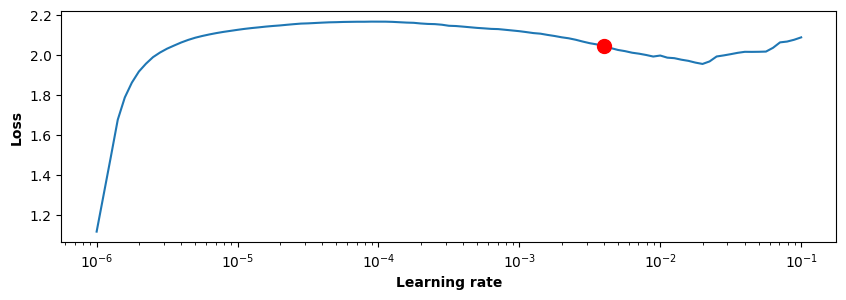

In [32]:
fig = lr_finder_2.plot(suggest=True)
new_lr_2 = lr_finder_2.suggestion()
print(f"Suggested learning rate: {new_lr_2:.6f}")

### Train

In [ ]:
mushrooms.batch_size = 256
model_2.hparams.learning_rate = 0.003981

os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":4096:8"
trainer_2 = create_trainer("model-2")

with suppress_certain_logs_and_warnings():
    trainer_2.fit(model=model_2, datamodule=mushrooms)
# Time: 20m 3.3s

## Model 3


### Define

::: {.callout-note}

#### Summary: Model 3

- **base model:** *model 1* that is based on _ResNet-18_ (pre-trained on the _ImageNet_ dataset)
- **replaced layers:** the same as *model 1* (*ResNet-18* with output layer replaced)
- **tuned layers:** all layers
- **batch size:** 128
- **learning rate:** 0.000079

:::


In this section, a copy of model 1 was created and all its layers were unfrozen (enabled to learn). During the tuning, all layers are trained.


In [49]:
resnet18_mod3 = deepcopy(resnet18_mod1)

model_3 = NN.load_from_checkpoint(
    "./logs/best-models/model-1--202401290144.ckpt",
    model=resnet18_mod3,
)

# Unfreeze weights of the model
for param in model_3.model.parameters():
    param.requires_grad = True

The output layer:

In [ ]:
print(resnet18_mod3.fc)

Linear(in_features=512, out_features=9, bias=True)


### Tune

As there are many more parameters to tune, the max batch size calculations were repeated and the results suggested batches of max 128 images.

In [ ]:
tuner.scale_batch_size(model_3, mode="power", datamodule=mushrooms)
# Time 1m 4.5s

<details class="with-border">
<summary>Output. Suggested max. batch size is 128. </summary>

```
`Trainer.fit` stopped: `max_steps=3` reached.
Batch size 2 succeeded, trying batch size 4
`Trainer.fit` stopped: `max_steps=3` reached.
Batch size 4 succeeded, trying batch size 8
`Trainer.fit` stopped: `max_steps=3` reached.
Batch size 8 succeeded, trying batch size 16
`Trainer.fit` stopped: `max_steps=3` reached.
Batch size 16 succeeded, trying batch size 32
`Trainer.fit` stopped: `max_steps=3` reached.
Batch size 32 succeeded, trying batch size 64
`Trainer.fit` stopped: `max_steps=3` reached.
Batch size 64 succeeded, trying batch size 128
The number of training batches (32) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
`Trainer.fit` stopped: `max_steps=3` reached.
Batch size 128 succeeded, trying batch size 256
The number of training batches (16) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
Batch size 256 failed, trying batch size 128
Finished batch size finder, will continue with full run using batch size 128

```

</details>

In [ ]:
mushrooms.batch_size = 128
lr_finder_3 = tuner.lr_find(model_3, datamodule=mushrooms, min_lr=1e-6, max_lr=1e-1)
# Time: 7m 19.4s

pd.DataFrame(lr_finder_3.results).to_csv("logs/lr_finder_3.csv")

Suggested learning rate: 0.000079


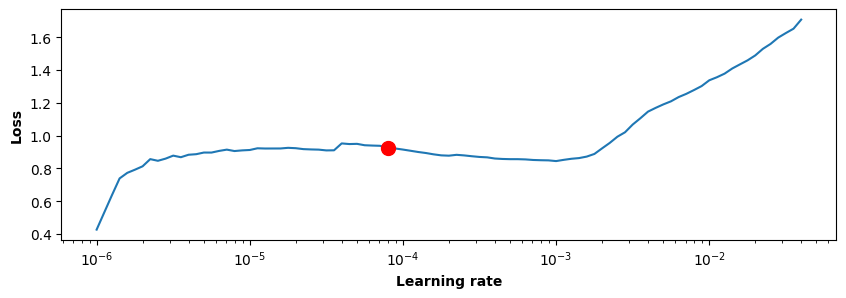

In [54]:
fig = lr_finder_3.plot(suggest=True)
new_lr_3 = lr_finder_3.suggestion()
print(f"Suggested learning rate: {new_lr_3:.6f}")

### Training

In [ ]:
mushrooms.batch_size = 128
model_3.hparams.learning_rate = 0.000079

os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":4096:8"
trainer_3 = create_trainer("model-3")

with suppress_certain_logs_and_warnings():
    trainer_3.fit(model=model_3, datamodule=mushrooms)
# Time: 36m 54.2s

## Model 4

::: {.callout-note}

#### Summary: Model 4

- **base model:** *model 2* that is based on _ResNet-18_ (pre-trained on the _ImageNet_ dataset)
- **replaced layers:** the same as *model 2* (*ResNet-18* without output + 3 layers)
- **tuned layers:** all layers
- **batch size:** 128
- **learning rate:** 0.000079

:::


In this section, a copy of model 2 was created and all its layers were unfrozen (enabled to learn).
During the tuning, all layers are trained.

In [162]:
resnet18_mod4 = deepcopy(resnet18_mod2)

model_4 = NN.load_from_checkpoint(
    "./logs/best-models/model-2--epoch=007--step=00128--val_loss=0.96--val_accuracy=0.581.ckpt",
    model=resnet18_mod4,
)

# Unfreeze weights of the model
for param in model_4.model.parameters():
    param.requires_grad = True

### Tune

The batch size of 128 was used again.

In [ ]:
mushrooms.batch_size = 128
lr_finder_4 = tuner.lr_find(model_4, datamodule=mushrooms, min_lr=1e-6, max_lr=1e-1)
# Time: 9m 16.1s

pd.DataFrame(lr_finder_4.results).to_csv("logs/lr_finder_4.csv")

Suggested learning rate: 0.000079


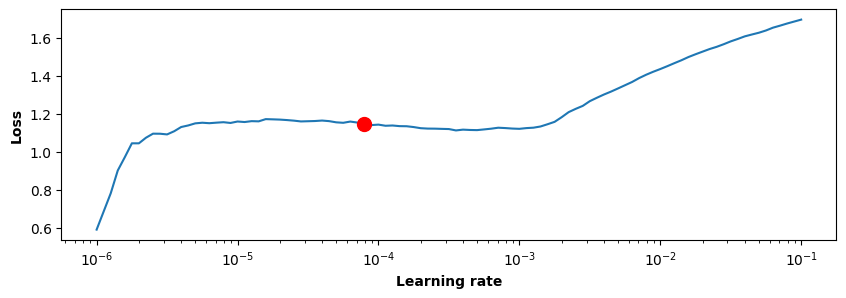

In [167]:
fig = lr_finder_4.plot(suggest=True)
new_lr_4 = lr_finder_4.suggestion()
print(f"Suggested learning rate: {new_lr_4:.6f}")

Interestingly, the same learning rate as for model 3 was suggested for this model too.

### Training

In [ ]:
mushrooms.batch_size = 128
model_4.hparams.learning_rate = 0.000079
os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":4096:8"
trainer_4 = create_trainer("model-4")

with suppress_certain_logs_and_warnings():
    trainer_4.fit(model=model_4, datamodule=mushrooms)
# Time: 35m 4.7s

# Results

## Monitor Training Process

To monitor the changes in training and validation metrics in each epoch, **TensorBoard** was used. 
A few print-screens of the TensorBoard are presented in the next section and @fig-tensorboard-example shows an interface of the tool. **PyTorch Profiler** was used too, but no major insights were found in the profiling reports.

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir=logs/

![Example: monitoring the training process metrics in TensorBoard.](img/2024-01-30--19-36-23.png){#fig-tensorboard-example width=800px}

## Compare Models

CSV log files with the monitored results (cross-entry loss, balanced accuracy and balanced accuracy \@Top2) were read and the information was collected into 2 (long-format and wide-format) data frames. Some information was logged only in TensorBoard, so a few screenshots will be presented too.
**Model selection criteria** were:

1) **performance** on a validation set;
2) **stability**: a difference in training and validation performance scores (the smaller the better).

The ***results*** show, that the *training process took longer* for Models 3 and 4 (see @fig-training-length-summary, @fig-duration-vs-epochs), which had more trainable parameters, and used with smaller learning rates, but also had smaller batch sizes (128 vs. 256). 

In terms of *balanced accuracy*, Models 1 and 2 performed worse than Models 3 and 4. Most probably due to a smaller number of trainable parameters. In most cases, Model 3 outperformed other models in classification accuracy. But the difference to Model 4 was not big (3.0%, see @tbl-best-val-accuracy). Unfortunately, Model 3 had a bigger difference in training and validation accuracies (6.2%) than Model 4 (<0.1%). So, **Model 4** at **epoch 9** with a validation **balanced accuracy** of **79.7%** and <0.1% difference in training and validation accuracies was selected as the **best model**. This model will be investigated in more detail in the next section.



More details on model training dynamics are visible in the figures below, and the best performance points of each model are presented in the tables.

In [550]:
# | code-summary: "Code: Helpers to format results"
# | code-fold: true

barcolor = "#aaa"

# Define colors for each model
colors = {
    "model-1": "#297db7",
    "model-2": "#FF7F0E",
    "model-3": "#2CA02C",
    "model-4": "#D62728",
}


# Function to apply color based on the model
def color_cells(val):
    return f'background-color: {colors.get(val, "white")}'

In [464]:
# | code-summary: "Code: Read the metrics log files"
# | code-fold: true


log_path_1 = "logs/csv_logs/model-1/version_0/metrics.csv"
log_path_2 = "logs/csv_logs/model-2/version_0/metrics.csv"
log_path_3 = "logs/csv_logs/model-3/version_0/metrics.csv"
log_path_4 = "logs/csv_logs/model-4/version_0/metrics.csv"

epoch_performance = pd.concat([
    read_metrics_log(log_path_1, "model-1"),
    read_metrics_log(log_path_2, "model-2"),
    read_metrics_log(log_path_3, "model-3"),
    read_metrics_log(log_path_4, "model-4"),
])

epoch_performance_wide = pd.concat([
    read_metrics_log(log_path_1, "model-1", out_format="wide"),
    read_metrics_log(log_path_2, "model-2", out_format="wide"),
    read_metrics_log(log_path_3, "model-3", out_format="wide"),
    read_metrics_log(log_path_4, "model-4", out_format="wide"),
])

A few rows of the imported CSV log (**long format**):

In [547]:
# | label: tbl-epoch-performance-long
# | tbl-cap: 'An **example** of imported performance in the long format
# | (top 4 rows).'
epoch_performance.head(4)

,epoch,set,accuracy,accuracy_top2,loss,model
0,0,train,0.14,0.25,7.70,model-1
1,0,val,0.21,0.40,4.83,model-1
2,1,train,0.27,0.40,4.39,model-1
3,1,val,0.45,0.56,2.16,model-1


<br>


Next, a few plots in the form of **TensorBoard** screenshots are presented:

![Training length summary (an annotated print screen from TensorBoard).](img/2024-01-30--17-18-31.png){#fig-training-length-summary} 


Explanation of the training duration results in @fig-training-length-summary: 

- "Run" indicates the directory with the log (it contains the model name);
- "Value" is a zero-based index of the last epoch (add +1 to get the number of total epochs);
- "Step" is the number of optimization steps (training batches) in total;
- "Relative" is the duration of training.

<br>

![Training length results (an annotated print screen from TensorBoard). Line colors: blue – Model 1, orange – Model 2, green – Model 3, red – Model 4.](img/2024-01-30--17-25-54.png){#fig-duration-vs-epochs width=800px}

In the following tables:

- `val_` – validation set scores;
- `train_` – training set scores;
- `_diff` – a difference between training and validation sets scores (positive numbers show that the training score is higher than the validation score);
- `accuracy` – balanced accuracy;
- `accuracy_top2` – balanced accuracy \@Top2;
- `loss` – cross-entropy loss.

In [770]:
# | label: tbl-best-val-loss
# | tbl-cap: 'Best **validation** cross-entropy **loss** for each model.'
# | code-fold: true

(
    epoch_performance_wide.sort_values(["val_loss"])
    .groupby("model")
    .head(1)
    .reset_index(drop=True)
    .style.format(precision=3)
    .bar(subset=["val_loss"], color=barcolor)
    .bar(subset=["loss_diff"], color=barcolor, align="zero")
    .map(color_cells, subset=["model"])
    .hide(axis="index")
)

epoch,val_accuracy_top2,val_loss,val_accuracy,train_accuracy,train_loss,train_accuracy_top2,loss_diff,accuracy_diff,accuracy_top2_diff,model
7,0.913,0.489,0.827,0.903,0.254,0.975,0.234,-0.076,-0.062,model-3
7,0.904,0.525,0.776,0.772,0.538,0.903,-0.012,0.004,0.000,model-4
8,0.815,0.867,0.652,0.620,0.969,0.789,-0.102,0.032,0.026,model-1
7,0.768,0.962,0.581,0.496,1.231,0.675,-0.269,0.086,0.092,model-2


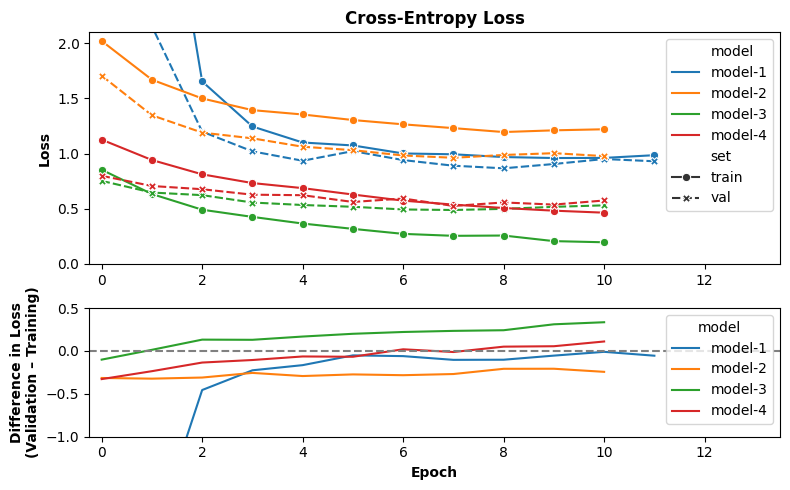

In [542]:
# | code-fold: true

# Create subplots
fig, axes = plt.subplots(
    nrows=2, ncols=1, figsize=(8, 5), gridspec_kw={"height_ratios": [9, 5]}
)

# Plot the first line plot
sns.lineplot(
    data=epoch_performance,
    x="epoch",
    y="loss",
    hue="model",
    style="set",
    markers=True,
    ax=axes[0],
)
# axes[0].set_yscale('log')
axes[0].set_title("Cross-Entropy Loss")
axes[0].set_xlim(-0.25, 13.5)
axes[0].set_ylim(0.0, 2.1)
axes[0].set_xlabel("")  # Remove x-axis title
axes[0].set_ylabel("Loss")

# Plot the second line plot
sns.lineplot(
    data=epoch_performance_wide,
    x="epoch",
    y="loss_diff",
    hue="model",
    markers=True,
    ax=axes[1],
)
axes[1].axhline(y=0, color="grey", linestyle="--")
axes[1].set_xlabel("Epoch")
axes[1].set_ylabel("Difference in Loss\n(Validation – Training)")
axes[1].set_xlim(-0.25, 13.5)
axes[1].set_ylim(-1.0, 0.5)

# Common

# Align y-axis labels
plt.tight_layout()
plt.show()

In [771]:
# | label: tbl-best-val-accuracy
# | tbl-cap: 'Best **validation balanced accuracy** (@Top 1) for each model.'
# | code-fold: true
# hide index
(
    epoch_performance_wide.sort_values(["val_accuracy"], ascending=False)
    .groupby("model")
    .head(1)
    .reset_index(drop=True)
    .style.format(precision=3)
    .bar(subset=["val_accuracy"], color=barcolor)
    .bar(subset=["accuracy_diff"], color=barcolor, align="zero")
    .map(color_cells, subset=["model"])
    .hide(axis="index")
)

epoch,val_accuracy_top2,val_loss,val_accuracy,train_accuracy,train_loss,train_accuracy_top2,loss_diff,accuracy_diff,accuracy_top2_diff,model
7,0.913,0.489,0.827,0.903,0.254,0.975,0.234,-0.076,-0.062,model-3
9,0.908,0.538,0.797,0.797,0.482,0.920,0.055,0.000,-0.013,model-4
9,0.831,0.906,0.675,0.621,0.960,0.792,-0.054,0.054,0.040,model-1
9,0.764,1.004,0.585,0.504,1.211,0.705,-0.207,0.081,0.059,model-2


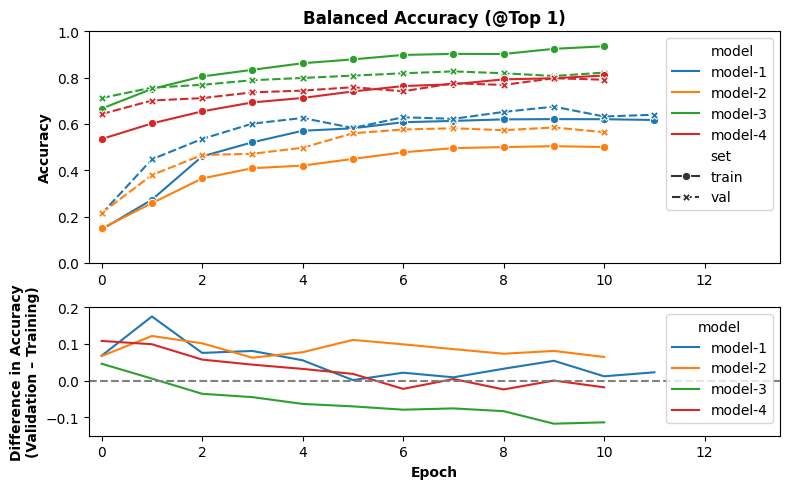

In [626]:
# | code-fold: true

# Create subplots
fig, axes = plt.subplots(
    nrows=2, ncols=1, figsize=(8, 5), gridspec_kw={"height_ratios": [9, 5]}
)

# Plot the first line plot
sns.lineplot(
    data=epoch_performance,
    x="epoch",
    y="accuracy",
    hue="model",
    style="set",
    markers=True,
    ax=axes[0],
)
axes[0].set_title("Balanced Accuracy (@Top 1)")
axes[0].set_xlim(-0.25, 13.5)
axes[0].set_ylim(0, 1)
axes[0].set_xlabel("")  # Remove x-axis title
axes[0].set_ylabel("Accuracy")

# Plot the second line plot
sns.lineplot(
    data=epoch_performance_wide,
    x="epoch",
    y="accuracy_diff",
    hue="model",
    markers=True,
    ax=axes[1],
)
axes[1].axhline(y=0, color="grey", linestyle="--")
axes[1].set_xlabel("Epoch")
axes[1].set_ylabel("Difference in Accuracy\n(Validation – Training)")
axes[1].set_xlim(-0.25, 13.5)
axes[1].set_ylim(-0.15, 0.20)

# Common
plt.tight_layout()
plt.show()

In [566]:
# | label: tbl-best-val-accuracy_top2
# | tbl-cap: 'Best **validation balanced accuracy @Top 2** for each model.'
# | code-fold: true

# Define colors for each model

(
    epoch_performance_wide.sort_values(["val_accuracy_top2"], ascending=False)
    .groupby("model")
    .head(1)
    .reset_index(drop=True)
    .style.format(precision=3)
    .bar(subset=["val_accuracy_top2"], color=barcolor)
    .bar(subset=["accuracy_top2_diff"], color=barcolor, align="zero")
    .map(color_cells, subset=["model"])
    .hide(axis="index")
)

epoch,val_accuracy_top2,val_loss,val_accuracy,train_accuracy,train_loss,train_accuracy_top2,loss_diff,accuracy_diff,accuracy_top2_diff,model
8,0.918,0.499,0.819,0.902,0.257,0.974,0.242,-0.083,-0.055,model-3
9,0.908,0.538,0.797,0.797,0.482,0.920,0.055,0.000,-0.013,model-4
9,0.831,0.906,0.675,0.621,0.960,0.792,-0.054,0.054,0.040,model-1
7,0.768,0.962,0.581,0.496,1.231,0.675,-0.269,0.086,0.092,model-2


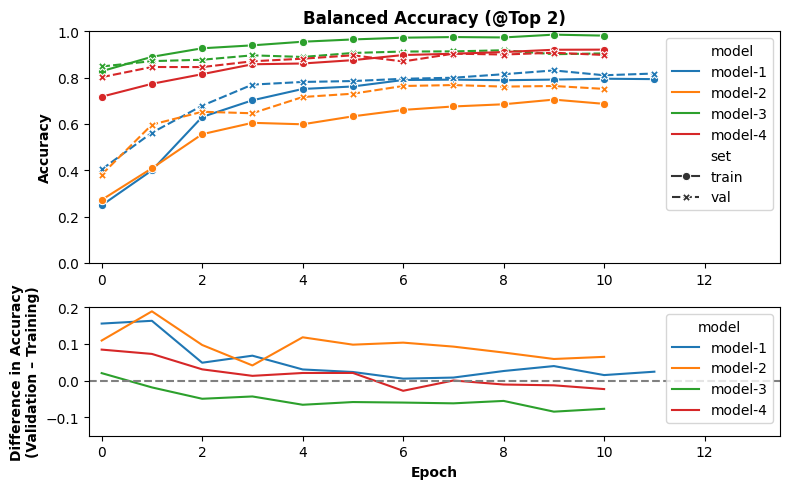

In [625]:
# | code-fold: true

# Create subplots
fig, axes = plt.subplots(
    nrows=2, ncols=1, figsize=(8, 5), gridspec_kw={"height_ratios": [9, 5]}
)

# Plot the first line plot
sns.lineplot(
    data=epoch_performance,
    x="epoch",
    y="accuracy_top2",
    hue="model",
    style="set",
    markers=True,
    ax=axes[0],
)
axes[0].set_title("Balanced Accuracy (@Top 2)")
axes[0].set_xlim(-0.25, 13.5)
axes[0].set_ylim(0, 1)
axes[0].set_xlabel("")  # Remove x-axis title
axes[0].set_ylabel("Accuracy")

# Plot the second line plot
sns.lineplot(
    data=epoch_performance_wide,
    x="epoch",
    y="accuracy_top2_diff",
    hue="model",
    markers=True,
    ax=axes[1],
)
axes[1].axhline(y=0, color="grey", linestyle="--")
axes[1].set_xlabel("Epoch")
axes[1].set_ylabel("Difference in Accuracy\n(Validation – Training)")
axes[1].set_xlim(-0.25, 13.5)
axes[1].set_ylim(-0.15, 0.20)

# Common
plt.tight_layout()
plt.show()

## Best Model Evaluation

In this section Model 4 (the **best model**), is re-evaluated on the validation set and evaluated on the test set. **Validation** balanced **accuracy** scores (regular and \@Top2) are **79.7%** and 90.1%, respectively. 
And respective **test** scores are a bit higher: **82.1%** and 92.6%. **Inference time** is 23.8 s ± 6.74 s per 1327 training set images, approximately **17.9 ms per image** (includes resized data loading, pre-processing and prediction).

*Confusion matrices* (see @fig-test-confusion-matrix) reveal, that most of the *Boletus* genus cases are captured correctly (sensitivity, a.k.a. recall, is 95.8%), while *Suillus* and *Entoloma* are captured the worst (sensitivity scores are 61.3% and 75.3%, respectively). Yet, the predictive value (a.k.a. precision) scores of *Suillus*, *Amanita* and *Boletus* were highest (90.5%, 90.4%, and 89.9% respectively) compared to other genera. And the most confused genera in the test set are these: 11.8% of predictions *Russula* are actually *Lactarius*, 10.8% of *Agaricus* are truly *Amanita* (which is **quite a dangerous fact**) and 9.7% *Etoloma* are truly *Cortinarius*.

@fig-classification-ok shows a random sample of correctly classified *images* in each genus while @fig-classification-wrong shows errors. It seems, that between the wrong predictions, there are more images, which zoom in on certain parts of the mushroom (e.g., gills, cap, etc.) while the correctly classified images are more often the whole mushrooms. Yet, these are just subjective observations, that should be investigated in more detail.

In [725]:
# | code-summary: "Code: Load Model 4 and create its trainer object"
# | code-fold: true


# Re-define the model from scratch (to have the required code in one place)
resnet18_mod4_final = models.resnet18()
resnet18_mod4_final.fc = nn.Sequential(
    nn.Linear(512, 256),
    nn.ReLU(),
    nn.Dropout(0.4),
    nn.Linear(256, 128),
    nn.ReLU(),
    nn.Dropout(0.4),
    nn.Linear(128, 9),
)
for param in resnet18_mod4_final.parameters():
    # Unfreeze weights of the model
    param.requires_grad = True

model_4_final = NN.load_from_checkpoint(
    "./logs/best-models/model-4--epoch=009--step=00320--val_loss=0.54--val_accuracy=0.797.ckpt",
    model=resnet18_mod4_final,
)

mushrooms.batch_size = 128
trainer_4_final = create_trainer("model-4-final", profiler=None)

In [703]:
# | code-summary: "Code: Evaluation on the validation set"
# | code-fold: true
with suppress_certain_logs_and_warnings():
    trainer_4_final.validate(model=model_4_final, datamodule=mushrooms)
# Time: 29.0s

Validation: |          | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
     Validate metric           DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      val_accuracy          0.7974560260772705
    val_accuracy_top2       0.9075928926467896
     val_loss_epoch          0.537671685218811
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [704]:
# | code-summary: "Code: Evaluation on the test set"
# | code-fold: true
with suppress_certain_logs_and_warnings():
    trainer_4_final.test(model=model_4_final, datamodule=mushrooms)

Testing: |          | 0/? [00:00<?, ?it/s]

No positive samples in targets, true positive value should be meaningless. Returning zero tensor in true positive score
No negative samples in targets, false positive value should be meaningless. Returning zero tensor in false positive score


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_accuracy         0.8213162422180176
   test_accuracy_top2       0.9263158440589905
         test_f1            0.8222283720970154
     test_loss_epoch        0.4872424006462097
      test_roc_auc          0.9830849170684814
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [705]:
# | code-summary: "Code: Prediction on training set"
# | code-fold: true

%%timeit
with suppress_certain_logs_and_warnings():
    output = trainer_4_final.predict(model=model_4_final, datamodule=mushrooms)

# Timing: 23.8 s ± 6.74 s per loop (mean ± std. dev. of 7 runs, 1 loop each)
# Total: 3m 9.3s

Predicting: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

Predicting: |          | 0/? [00:00<?, ?it/s]

23.8 s ± 6.74 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [776]:
23.8 / 1327 * 1000  # ms per image

17.935192162773173

In [736]:
# | code-summary: "Code: Collect data from different batches"
# | code-fold: true

# Collect data from different batches
test_preds = []
test_targets = []
test_files = []

for batch_result in output:
    test_preds.extend(batch_result["pred"].tolist())
    test_targets.extend(batch_result["target"].tolist())
    test_files.extend(batch_result["file"])

outputs_df = pd.DataFrame({
    "file": test_files,
    "pred": test_preds,
    "target": test_targets,
})

test_preds_labels = mushrooms.class_codes_to_labels(test_preds)
test_targets_labels = mushrooms.class_codes_to_labels(test_targets)

In this classification report below, "accuracy" means "regular accuracy", i.e., the percentage of correctly classified images. In most other places "accuracy" means "balanced accuracy", i.e., the macro average of correctly classified percentages of instances per class:

In [785]:
# | code-summary: "Code: Classification report"
# | code-fold: true
print(classification_report(test_targets_labels, test_preds_labels, digits=3))

              precision    recall  f1-score   support

    Agaricus      0.675     0.800     0.732        70
     Amanita      0.904     0.886     0.895       149
     Boletus      0.899     0.958     0.928       214
 Cortinarius      0.854     0.808     0.831       167
    Entoloma      0.764     0.753     0.759        73
   Hygrocybe      0.812     0.889     0.848        63
   Lactarius      0.852     0.807     0.829       300
     Russula      0.820     0.878     0.848       229
     Suillus      0.905     0.613     0.731        62

    accuracy                          0.844      1327
   macro avg      0.832     0.821     0.822      1327
weighted avg      0.847     0.844     0.843      1327



Let's visualize the results in the training set.

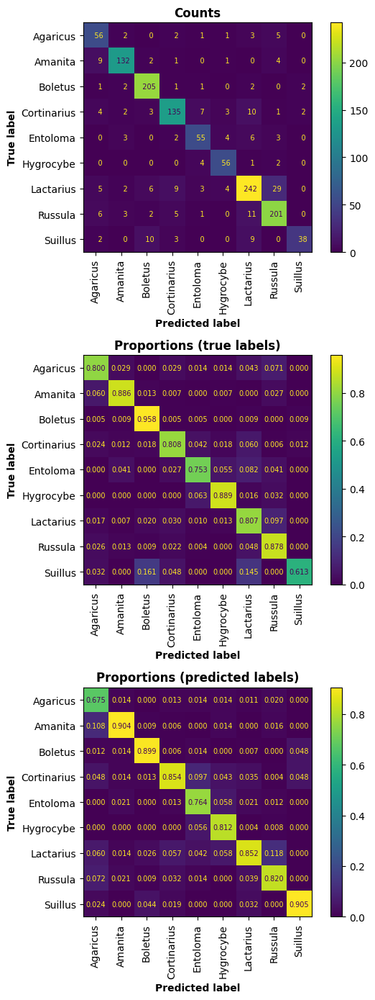

In [787]:
# | label: fig-test-confusion-matrix
# | fig-cap: 'Confusion matrices for the test set.'
# | code-fold: true

plot_confusion_matrices(
    test_targets_labels,
    test_preds_labels,
    xticks_rotation=90,
    layout="vertical",
    figsize=(6, 14),
    text_kw={"fontsize": 7},
)
plt.tight_layout()
plt.show()

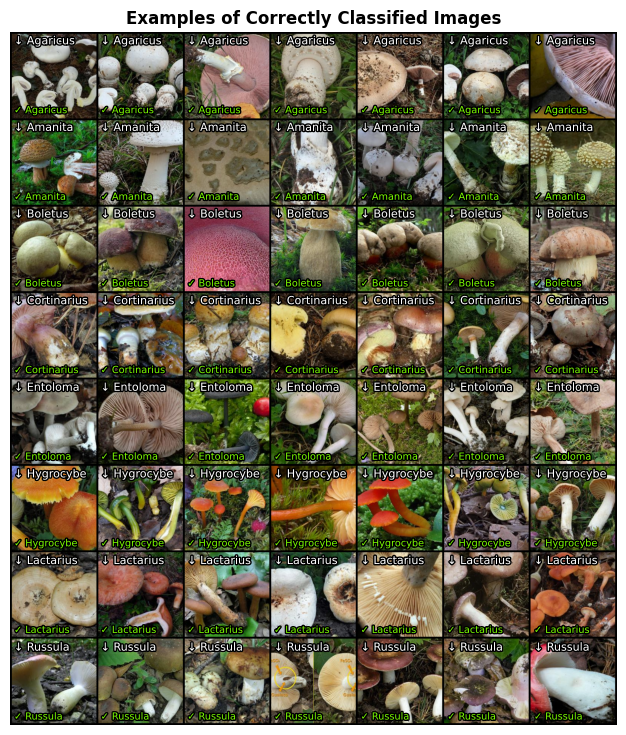

In [ ]:
# | label: fig-classification-ok
# | fig-cap: 'Examples of **correctly** classified test set images
# |      in each genus. True class label is at the top of the image in white. '
# | code-summary: Code of the figure
# | code-fold: true

# Parameters
n_per_class = 7
condition = "set == 'test' & pred == target"
title = "Examples of Correctly (✓) Classified Images"
random_state = 142
figsize = (10, 9)

# Code
test_preview = deepcopy(mushrooms)
test_preview.batch_size = n_per_class * 9
test_preview.metadata = (
    pd.merge(test_preview.metadata, outputs_df, on="file", how="left")
    .query(condition)
    .sample(frac=1, random_state=random_state)
    .groupby("class_code")
    .head(n_per_class)
    .sort_values(["class_label", "pred"])
)
test_preview.setup()

for images, class_codes, files in test_preview.test_dataloader():
    pred = pd.merge(pd.DataFrame({"file": files}), outputs_df, on="file", how="left")

    plot_grid_of_images(
        images,
        true_class_codes=class_codes,
        pred_class_codes=pred.pred,
        list_of_class_labels=test_preview.class_labels,
        n_cols=n_per_class,
        figsize=figsize,
    )
    plt.title(title)
    break

del test_preview, images, class_codes, files, pred

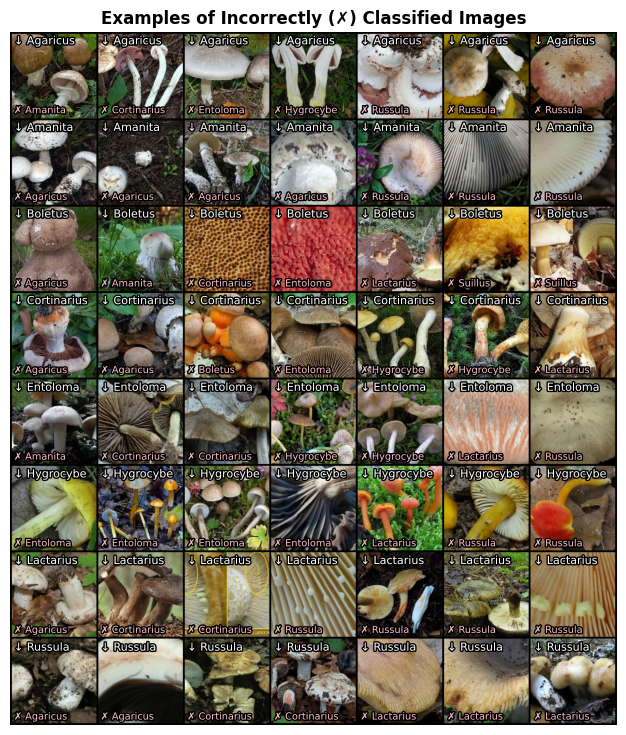

In [768]:
# | label: fig-classification-wrong
# | fig-cap: 'Examples of **incorrectly** classified test set images
# |      in each genus. True class label is at the top of the image in white.'
# | code-summary: Code of the figure
# | code-fold: true

# Parameters
n_per_class = 7
condition = "set == 'test' & pred != target"
title = "Examples of Incorrectly (✗) Classified Images"
random_state = 142
figsize = (10, 9)

# Code
test_preview = deepcopy(mushrooms)
test_preview.batch_size = n_per_class * 9
test_preview.metadata = (
    pd.merge(test_preview.metadata, outputs_df, on="file", how="left")
    .query(condition)
    .sample(frac=1, random_state=random_state)
    .groupby("class_code")
    .head(n_per_class)
    .sort_values(["class_label", "pred"])
)
test_preview.setup()

for images, class_codes, files in test_preview.test_dataloader():
    pred = pd.merge(pd.DataFrame({"file": files}), outputs_df, on="file", how="left")

    plot_grid_of_images(
        images,
        true_class_codes=class_codes,
        pred_class_codes=pred.pred,
        list_of_class_labels=test_preview.class_labels,
        n_cols=n_per_class,
        figsize=figsize,
    )
    plt.title(title)
    break

del test_preview, images, class_codes, files, pred

# Final Remarks {.unnumbered}


This section contains final remarks related to the technical side of this project.

1.  Warnings `warnings.filterwarnings("ignore", ".*does not have many workers.*")`{.py} were related to not using parallelisation for data loaders. On my machine, it was much quicker to load data without parallelisation.

2.  I was not able to use the option of predictable algorithms (e.g., `deterministic=True`{.py}) as it was causing errors:

<details class="with-border">

<summary>Note deterministic behavior with CUDA ≥ 10.2 </summary>

**RuntimeError:** Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: `CUBLAS_WORKSPACE_CONFIG=:4096:8` or `CUBLAS_WORKSPACE_CONFIG=:16:8`. For more information, go to <https://docs.nvidia.com/cuda/cublas/index.html#cublasApi_reproducibility>

</details>

3. After I got the message above, I forgot to use `seed_everything()`{.py} or similar functions, so the results might be not fully reproducible.
 
4. Yet for creating training, validation, and test sets, I used `randon_state = 42` option, which ensures the reproducibility of the data split.

5. I'm not sure if `os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":4096:8"`{.py} should be set before each model training or it is enough to set it once at the beginning of the script. This is even more confusing with notebooks.

6. Choosing early stopping patience for 3 epochs might be a too small number.

7. In addition to balanced accuracy scores (\@Top 1 and \@Top 2), other metrics could be used too, e.g., F1 score, ROC AUC in training and validation. I was guessing that the additional metrics might slow down computations significantly, but I did not test it.

8. The profiler was enabled during each training but it might be redundant to use it during the whole training process. Not sure what are the best practices here.

9. More model architectures could be tested, e.g., ResNet-50, ResNet-101, etc.

10. More hyperparameters could be tried, e.g., the number of layers to unfreeze, different batch sizes, etc.
    - yet, for model 3, I tried small batch size (8 images), fewer epochs were required before early stopping, but the results were worse than for model 3 with batch size 128. The results are not presented in the report.
  
11. Some parts of the code could be refactored, e.g., the code of the last 2 plots with mushrooms has a lot of repetitions. Now I'd improve some PyTorch and Lightning-related parts of this project too mo make less code and make them more convenient. Yet, at the end of the project, it is not worth spending too much time on refactoring.

12. I'm not yet sure how to correctly deal with messages/warnings like these:  
> No positive samples in targets, true positive value should be meaningless. Returning zero tensor in true positive score  
> No negative samples in targets, false positive value should be meaningless. Returning zero tensor in false positive score

13. Term "accuracy" is a bit confusing in this project: sometimes it means standard accuracy (in the SciKit Learn's classification report), but most of the time it means "balanced accuracy" (macro average of each group's accuracy scores). This confusion appears due to the way how multi-class accuracy is defined in `torchmetics`.
